<a href="https://colab.research.google.com/github/guidobavosacastelao/Curso_Python_2022/blob/main/Cuaderno_5.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [4]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np 
from pandas.api.types import is_string_dtype, is_numeric_dtype
from google.colab import files
import missingno as msno

Bajo un archivo de la siguiente url: [medium_data.csv](https://www.kaggle.com/datasets/dorianlazar/medium-articles-dataset)


In [ ]:
 files.upload() # Cargo el archivo

In [6]:
df = pd.read_csv('medium_data.csv')

In [7]:
df

,id,url,title,subtitle,image,claps,responses,reading_time,publication,date
0,1,https://towardsdatascience.com/a-beginners-gui...,A Beginner’s Guide to Word Embedding with Gens...,NaN,1.png,850,8,8,Towards Data Science,2019-05-30
1,2,https://towardsdatascience.com/hands-on-graph-...,Hands-on Graph Neural Networks with PyTorch & ...,NaN,2.png,1100,11,9,Towards Data Science,2019-05-30
2,3,https://towardsdatascience.com/how-to-use-ggpl...,How to Use ggplot2 in Python,A Grammar of Graphics for Python,3.png,767,1,5,Towards Data Science,2019-05-30
3,4,https://towardsdatascience.com/databricks-how-...,Databricks: How to Save Files in CSV on Your L...,When I work on Python projects dealing…,4.jpeg,354,0,4,Towards Data Science,2019-05-30
4,5,https://towardsdatascience.com/a-step-by-step-...,A Step-by-Step Implementation of Gradient Desc...,One example of building neural…,5.jpeg,211,3,4,Towards Data Science,2019-05-30
...,...,...,...,...,...,...,...,...,...,...
6503,6504,https://medium.com/better-marketing/we-vs-i-ho...,“We” vs “I” — How Should You Talk About Yourse...,Basic copywriting choices with a big…,6504.jpg,661,6,6,Better Marketing,2019-12-05
6504,6505,https://medium.com/better-marketing/how-donald...,How Donald Trump Markets Himself,Lessons from who might be the most popular bra...,6505.jpeg,189,1,5,Better Marketing,2019-12-05
6505,6506,https://medium.com/better-marketing/content-an...,Content and Marketing Beyond Mass Consumption,How to acquire customers without wasting money...,6506.jpg,207,1,8,Better Marketing,2019-12-05
6506,6507,https://medium.com/better-marketing/5-question...,5 Questions All Copywriters Should Ask Clients...,Save time and effort by…,6507.jpg,253,2,5,Better Marketing,2019-12-05


SEMI-AUTOMATIC EDA

In [8]:
df.head(5)

,id,url,title,subtitle,image,claps,responses,reading_time,publication,date
0,1,https://towardsdatascience.com/a-beginners-gui...,A Beginner’s Guide to Word Embedding with Gens...,NaN,1.png,850,8,8,Towards Data Science,2019-05-30
1,2,https://towardsdatascience.com/hands-on-graph-...,Hands-on Graph Neural Networks with PyTorch & ...,NaN,2.png,1100,11,9,Towards Data Science,2019-05-30
2,3,https://towardsdatascience.com/how-to-use-ggpl...,How to Use ggplot2 in Python,A Grammar of Graphics for Python,3.png,767,1,5,Towards Data Science,2019-05-30
3,4,https://towardsdatascience.com/databricks-how-...,Databricks: How to Save Files in CSV on Your L...,When I work on Python projects dealing…,4.jpeg,354,0,4,Towards Data Science,2019-05-30
4,5,https://towardsdatascience.com/a-step-by-step-...,A Step-by-Step Implementation of Gradient Desc...,One example of building neural…,5.jpeg,211,3,4,Towards Data Science,2019-05-30


In [9]:
df.info

<bound method DataFrame.info of         id                                                url  \
0        1  https://towardsdatascience.com/a-beginners-gui...   
1        2  https://towardsdatascience.com/hands-on-graph-...   
2        3  https://towardsdatascience.com/how-to-use-ggpl...   
3        4  https://towardsdatascience.com/databricks-how-...   
4        5  https://towardsdatascience.com/a-step-by-step-...   
...    ...                                                ...   
6503  6504  https://medium.com/better-marketing/we-vs-i-ho...   
6504  6505  https://medium.com/better-marketing/how-donald...   
6505  6506  https://medium.com/better-marketing/content-an...   
6506  6507  https://medium.com/better-marketing/5-question...   
6507  6508  https://medium.com/better-marketing/how-to-wri...   

                                                  title  \
0     A Beginner’s Guide to Word Embedding with Gens...   
1     Hands-on Graph Neural Networks with PyTorch & ...   
2         

In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6508 entries, 0 to 6507
Data columns (total 10 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   id            6508 non-null   int64 
 1   url           6508 non-null   object
 2   title         6508 non-null   object
 3   subtitle      3479 non-null   object
 4   image         6361 non-null   object
 5   claps         6508 non-null   int64 
 6   responses     6508 non-null   object
 7   reading_time  6508 non-null   int64 
 8   publication   6508 non-null   object
 9   date          6508 non-null   object
dtypes: int64(3), object(7)
memory usage: 508.6+ KB


In [12]:
df.describe() # Resumen de variables numéricas

,id,claps,reading_time
count,6508.000000,6508.000000,6508.000000
mean,3254.500000,311.076060,6.134911
std,1878.842108,950.789896,3.231918
min,1.000000,0.000000,0.000000
25%,1627.750000,54.000000,4.000000
50%,3254.500000,115.000000,5.000000
75%,4881.250000,268.250000,7.000000
max,6508.000000,38000.000000,55.000000


In [13]:
df.query(" claps  >= 30000") # Genero una Query para inspeccionar el numero máx de claps

,id,url,title,subtitle,image,claps,responses,reading_time,publication,date
4552,4553,https://medium.com/swlh/i-have-15-ideas-to-cha...,I Have 15 ideas To Change Your Life. Do you Ha...,NaN,4553.png,38000,170,5,The Startup,2019-05-20


In [14]:
df.describe(include='all') # Incluyo todas las columnas del DataSet

,id,url,title,subtitle,image,claps,responses,reading_time,publication,date
count,6508.000000,6508,6508,3479,6361,6508.000000,6508,6508.000000,6508,6508
unique,NaN,6508,6504,3470,6361,NaN,56,NaN,7,50
top,NaN,https://towardsdatascience.com/a-beginners-gui...,Lost in translation,"<em class=""markup--em markup--h4-em"">A weekly ...",1.png,NaN,0,NaN,The Startup,2019-10-21
freq,NaN,1,2,5,1,NaN,3396,NaN,3041,197
mean,3254.500000,NaN,NaN,NaN,NaN,311.076060,NaN,6.134911,NaN,NaN
std,1878.842108,NaN,NaN,NaN,NaN,950.789896,NaN,3.231918,NaN,NaN
min,1.000000,NaN,NaN,NaN,NaN,0.000000,NaN,0.000000,NaN,NaN
25%,1627.750000,NaN,NaN,NaN,NaN,54.000000,NaN,4.000000,NaN,NaN
50%,3254.500000,NaN,NaN,NaN,NaN,115.000000,NaN,5.000000,NaN,NaN
75%,4881.250000,NaN,NaN,NaN,NaN,268.250000,NaN,7.000000,NaN,NaN


In [15]:
df.isnull().sum() # Sumo los Nulls

id                 0
url                0
title              0
subtitle        3029
image            147
claps              0
responses          0
reading_time       0
publication        0
date               0
dtype: int64

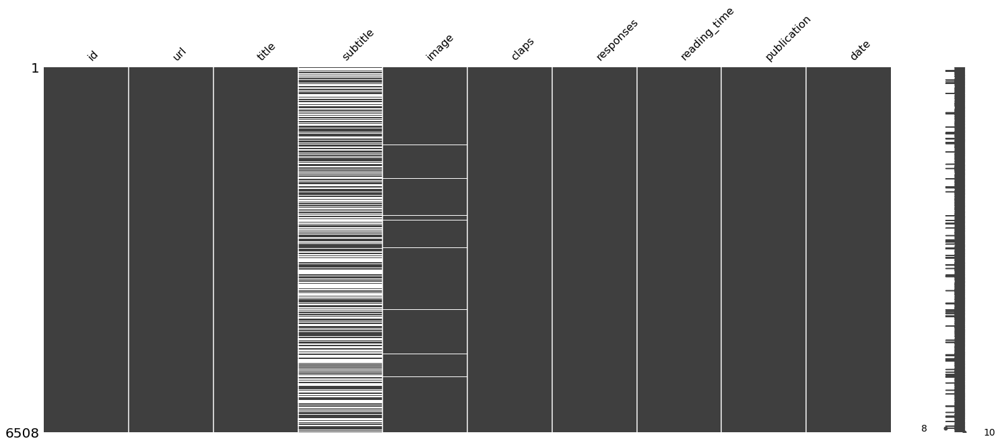

In [16]:
msno.matrix(df) # Ploteo los nulls

In [17]:
# Valores Faltantes

missing_count = df.isnull().sum() # suma los missings
value_count = df.isnull().count() # cuenta los missings
missing_percentage = round(missing_count / value_count * 100,2) #calculo el porcentaje de los missings 
missing_df = pd.DataFrame({'count': missing_count, 'percentage': missing_percentage}) # genero el data frame
print(missing_df)


              count  percentage
id                0        0.00
url               0        0.00
title             0        0.00
subtitle       3029       46.54
image           147        2.26
claps             0        0.00
responses         0        0.00
reading_time      0        0.00
publication       0        0.00
date              0        0.00


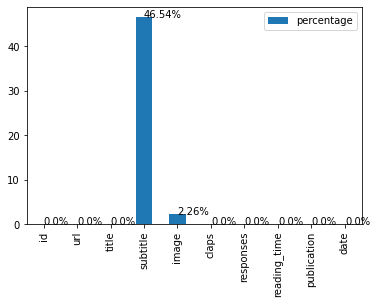

In [18]:
# Visualizo los missings
barchart = missing_df.plot.bar(y='percentage')
for index, percentage in enumerate(missing_percentage):
    barchart.text(index, percentage, str(percentage) + '%' )

In [19]:
# Feature Engineering 

df['title_length'] = df['title'].apply(len) # Genero una nueva columna
df

,id,url,title,subtitle,image,claps,responses,reading_time,publication,date,title_length
0,1,https://towardsdatascience.com/a-beginners-gui...,A Beginner’s Guide to Word Embedding with Gens...,NaN,1.png,850,8,8,Towards Data Science,2019-05-30,63
1,2,https://towardsdatascience.com/hands-on-graph-...,Hands-on Graph Neural Networks with PyTorch & ...,NaN,2.png,1100,11,9,Towards Data Science,2019-05-30,63
2,3,https://towardsdatascience.com/how-to-use-ggpl...,How to Use ggplot2 in Python,A Grammar of Graphics for Python,3.png,767,1,5,Towards Data Science,2019-05-30,28
3,4,https://towardsdatascience.com/databricks-how-...,Databricks: How to Save Files in CSV on Your L...,When I work on Python projects dealing…,4.jpeg,354,0,4,Towards Data Science,2019-05-30,59
4,5,https://towardsdatascience.com/a-step-by-step-...,A Step-by-Step Implementation of Gradient Desc...,One example of building neural…,5.jpeg,211,3,4,Towards Data Science,2019-05-30,69
...,...,...,...,...,...,...,...,...,...,...,...
6503,6504,https://medium.com/better-marketing/we-vs-i-ho...,“We” vs “I” — How Should You Talk About Yourse...,Basic copywriting choices with a big…,6504.jpg,661,6,6,Better Marketing,2019-12-05,65
6504,6505,https://medium.com/better-marketing/how-donald...,How Donald Trump Markets Himself,Lessons from who might be the most popular bra...,6505.jpeg,189,1,5,Better Marketing,2019-12-05,32
6505,6506,https://medium.com/better-marketing/content-an...,Content and Marketing Beyond Mass Consumption,How to acquire customers without wasting money...,6506.jpg,207,1,8,Better Marketing,2019-12-05,45
6506,6507,https://medium.com/better-marketing/5-question...,5 Questions All Copywriters Should Ask Clients...,Save time and effort by…,6507.jpg,253,2,5,Better Marketing,2019-12-05,78


In [20]:
# Extraigo el mes de la fecha

df['month'] = pd.to_datetime(df['date']).dt.month.apply(str)
df

,id,url,title,subtitle,image,claps,responses,reading_time,publication,date,title_length,month
0,1,https://towardsdatascience.com/a-beginners-gui...,A Beginner’s Guide to Word Embedding with Gens...,NaN,1.png,850,8,8,Towards Data Science,2019-05-30,63,5
1,2,https://towardsdatascience.com/hands-on-graph-...,Hands-on Graph Neural Networks with PyTorch & ...,NaN,2.png,1100,11,9,Towards Data Science,2019-05-30,63,5
2,3,https://towardsdatascience.com/how-to-use-ggpl...,How to Use ggplot2 in Python,A Grammar of Graphics for Python,3.png,767,1,5,Towards Data Science,2019-05-30,28,5
3,4,https://towardsdatascience.com/databricks-how-...,Databricks: How to Save Files in CSV on Your L...,When I work on Python projects dealing…,4.jpeg,354,0,4,Towards Data Science,2019-05-30,59,5
4,5,https://towardsdatascience.com/a-step-by-step-...,A Step-by-Step Implementation of Gradient Desc...,One example of building neural…,5.jpeg,211,3,4,Towards Data Science,2019-05-30,69,5
...,...,...,...,...,...,...,...,...,...,...,...,...
6503,6504,https://medium.com/better-marketing/we-vs-i-ho...,“We” vs “I” — How Should You Talk About Yourse...,Basic copywriting choices with a big…,6504.jpg,661,6,6,Better Marketing,2019-12-05,65,12
6504,6505,https://medium.com/better-marketing/how-donald...,How Donald Trump Markets Himself,Lessons from who might be the most popular bra...,6505.jpeg,189,1,5,Better Marketing,2019-12-05,32,12
6505,6506,https://medium.com/better-marketing/content-an...,Content and Marketing Beyond Mass Consumption,How to acquire customers without wasting money...,6506.jpg,207,1,8,Better Marketing,2019-12-05,45,12
6506,6507,https://medium.com/better-marketing/5-question...,5 Questions All Copywriters Should Ask Clients...,Save time and effort by…,6507.jpg,253,2,5,Better Marketing,2019-12-05,78,12


In [21]:
# Si el Artículo tiene subtitulo ( Si tiene coloca un Yes, si no tiene coloca un No)

df['with_subtitle'] = np.where(df['subtitle'].isnull(), 'No', 'Yes')
df

,id,url,title,subtitle,image,claps,responses,reading_time,publication,date,title_length,month,with_subtitle
0,1,https://towardsdatascience.com/a-beginners-gui...,A Beginner’s Guide to Word Embedding with Gens...,NaN,1.png,850,8,8,Towards Data Science,2019-05-30,63,5,No
1,2,https://towardsdatascience.com/hands-on-graph-...,Hands-on Graph Neural Networks with PyTorch & ...,NaN,2.png,1100,11,9,Towards Data Science,2019-05-30,63,5,No
2,3,https://towardsdatascience.com/how-to-use-ggpl...,How to Use ggplot2 in Python,A Grammar of Graphics for Python,3.png,767,1,5,Towards Data Science,2019-05-30,28,5,Yes
3,4,https://towardsdatascience.com/databricks-how-...,Databricks: How to Save Files in CSV on Your L...,When I work on Python projects dealing…,4.jpeg,354,0,4,Towards Data Science,2019-05-30,59,5,Yes
4,5,https://towardsdatascience.com/a-step-by-step-...,A Step-by-Step Implementation of Gradient Desc...,One example of building neural…,5.jpeg,211,3,4,Towards Data Science,2019-05-30,69,5,Yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6503,6504,https://medium.com/better-marketing/we-vs-i-ho...,“We” vs “I” — How Should You Talk About Yourse...,Basic copywriting choices with a big…,6504.jpg,661,6,6,Better Marketing,2019-12-05,65,12,Yes
6504,6505,https://medium.com/better-marketing/how-donald...,How Donald Trump Markets Himself,Lessons from who might be the most popular bra...,6505.jpeg,189,1,5,Better Marketing,2019-12-05,32,12,Yes
6505,6506,https://medium.com/better-marketing/content-an...,Content and Marketing Beyond Mass Consumption,How to acquire customers without wasting money...,6506.jpg,207,1,8,Better Marketing,2019-12-05,45,12,Yes
6506,6507,https://medium.com/better-marketing/5-question...,5 Questions All Copywriters Should Ask Clients...,Save time and effort by…,6507.jpg,253,2,5,Better Marketing,2019-12-05,78,12,Yes


In [22]:
# Elimina determinadas columnas

df = df.drop(['id', 'subtitle', 'title', 'url', 'date', 'image', 'responses'], axis=1)
df

,claps,reading_time,publication,title_length,month,with_subtitle
0,850,8,Towards Data Science,63,5,No
1,1100,9,Towards Data Science,63,5,No
2,767,5,Towards Data Science,28,5,Yes
3,354,4,Towards Data Science,59,5,Yes
4,211,4,Towards Data Science,69,5,Yes
...,...,...,...,...,...,...
6503,661,6,Better Marketing,65,12,Yes
6504,189,5,Better Marketing,32,12,Yes
6505,207,8,Better Marketing,45,12,Yes
6506,253,5,Better Marketing,78,12,Yes


In [23]:
# Genero valores para la lista de atributos numericos y categoricos

num_list = []
cat_list = []

for column in df:
 if is_numeric_dtype(df[column]):
        num_list.append(column)
 elif is_string_dtype(df[column]):
        cat_list.append(column)    

print(num_list)
print(cat_list)

['claps', 'reading_time', 'title_length']
['publication', 'month', 'with_subtitle']


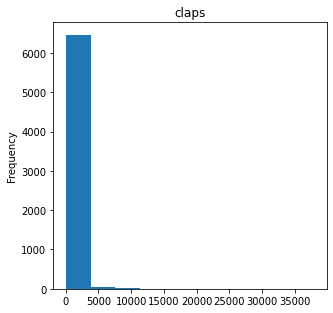

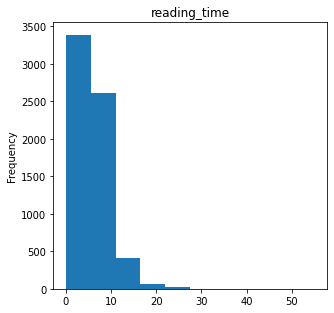

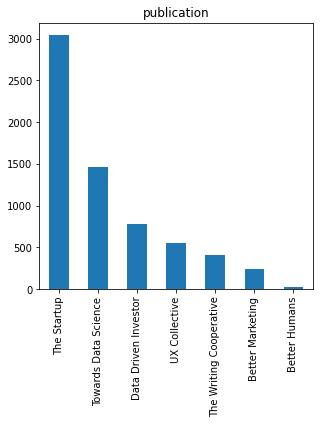

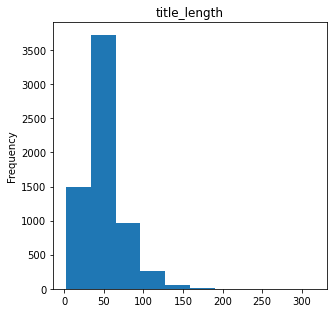

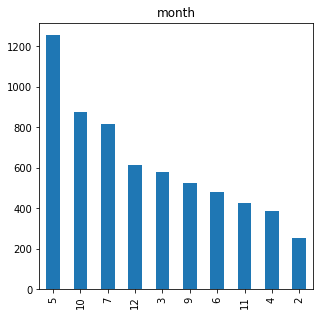

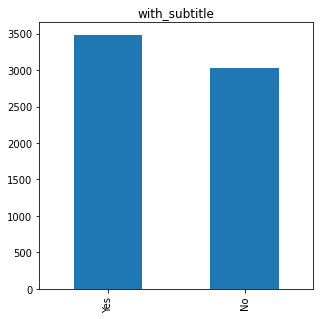

In [ ]:
# Gráfico de barras e histograma

for column in df:
    plt.figure(column, figsize = (4.9,4.9))
    plt.title(column)
    if is_numeric_dtype(df[column]):
        df[column].plot(kind = 'hist')
    elif is_string_dtype(df[column]):

# Toma solo los TOP 10 valores de cada variable categórica
 
        df[column].value_counts()[:10].plot(kind = 'bar')

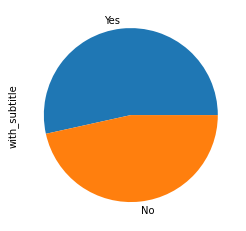

In [ ]:
# Puedo replicar el ultimo grafico de barras con un grafico de torta
df[column].value_counts()[:10].plot(kind = 'pie')

# Análisis Multivariado

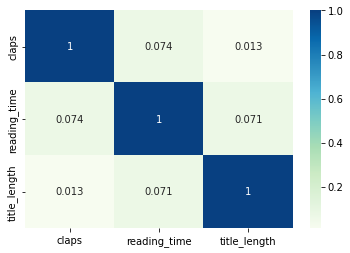

In [ ]:
correlation = df.corr()
sns.heatmap(correlation, cmap = "GnBu", annot = True) # Matriz de correlación

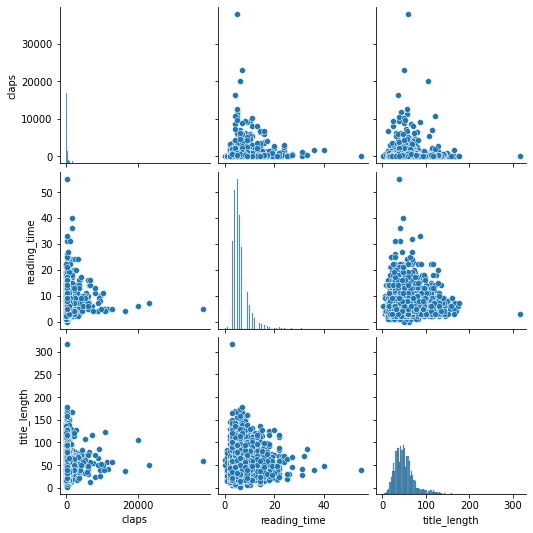

In [ ]:
# PairPlot
sns.pairplot(df,height = 2.5)

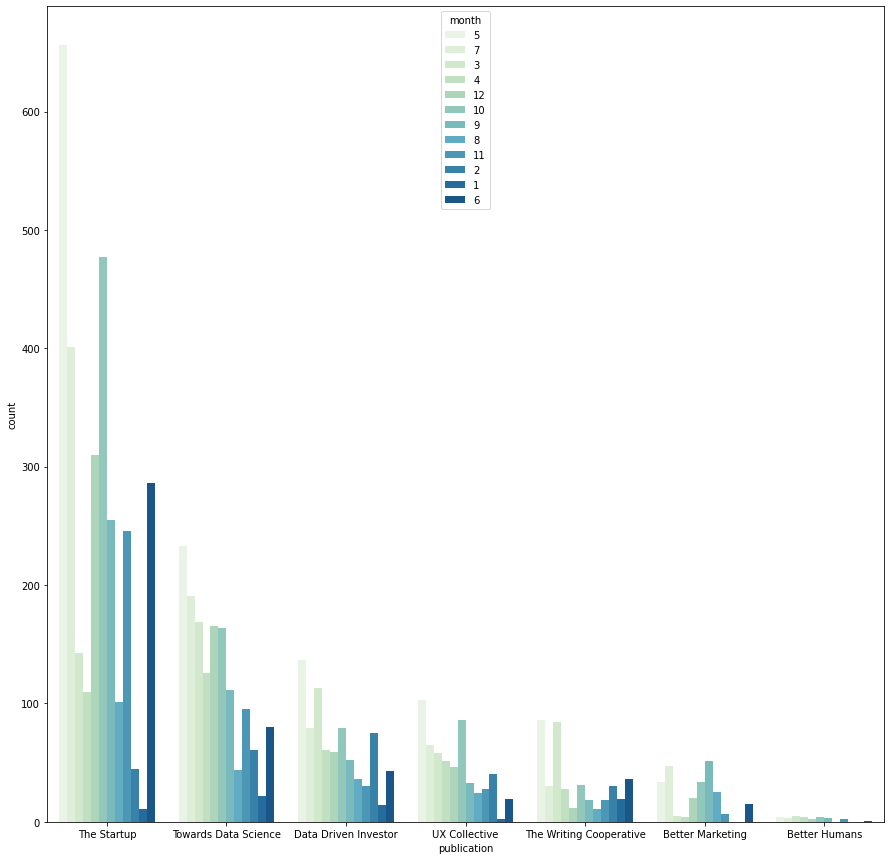

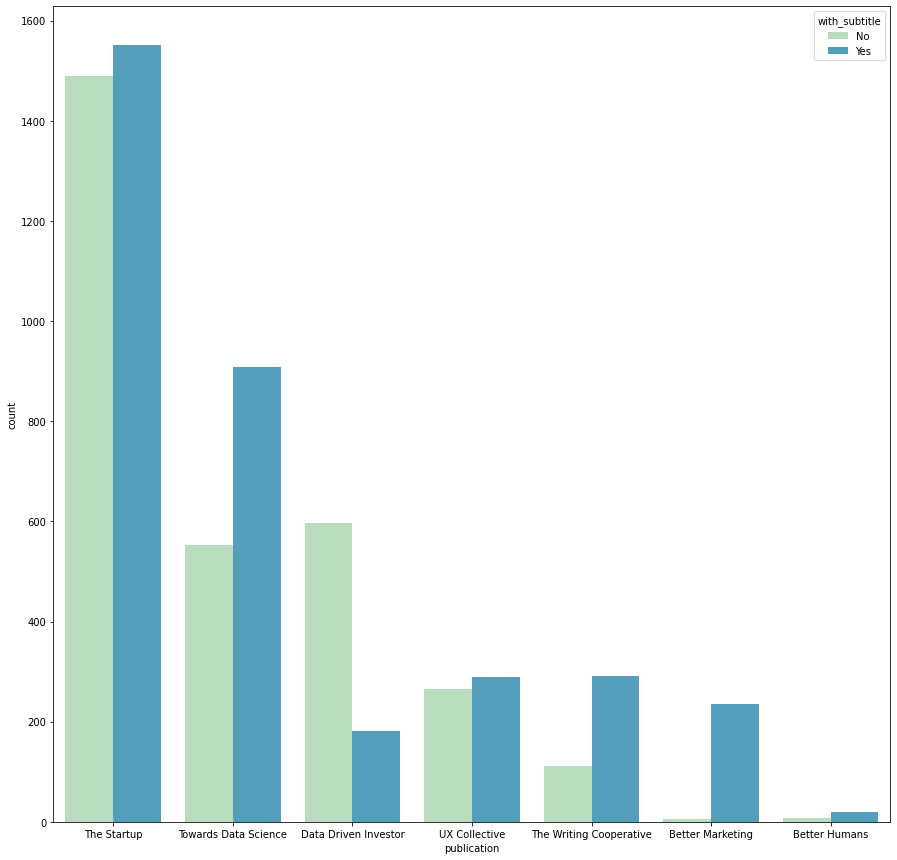

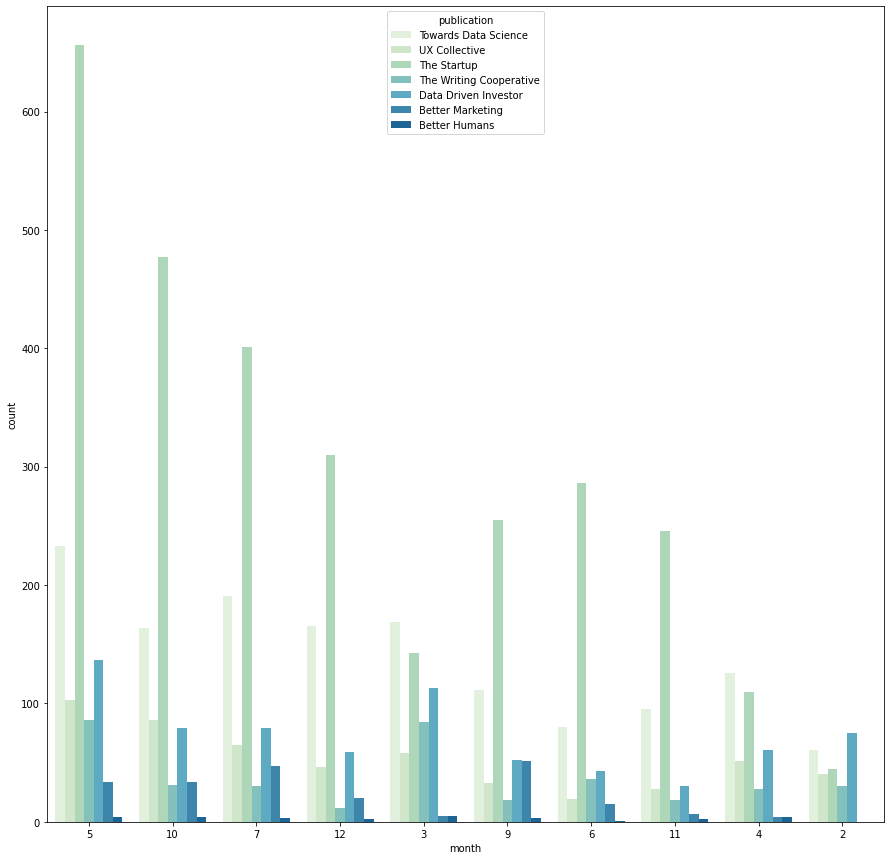

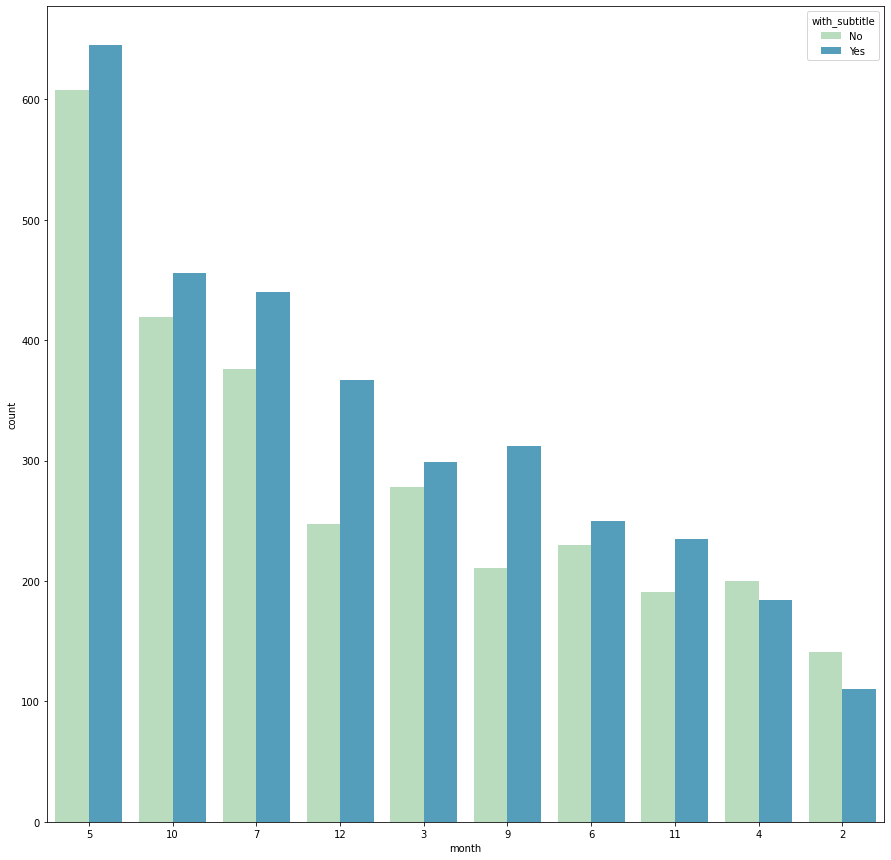

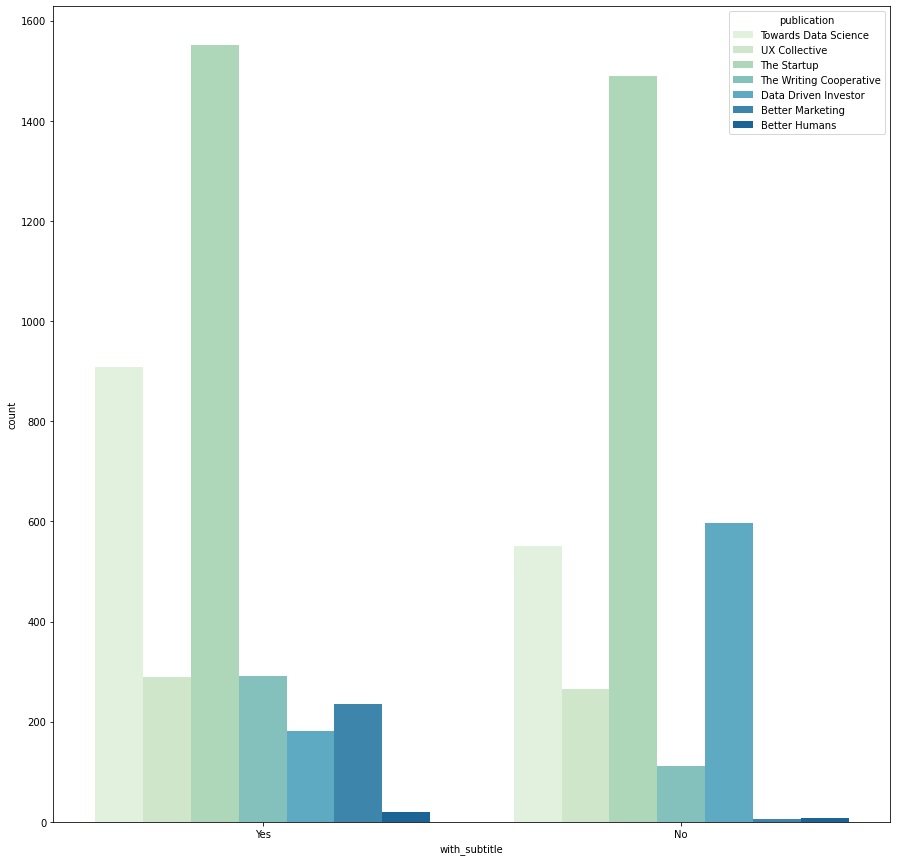

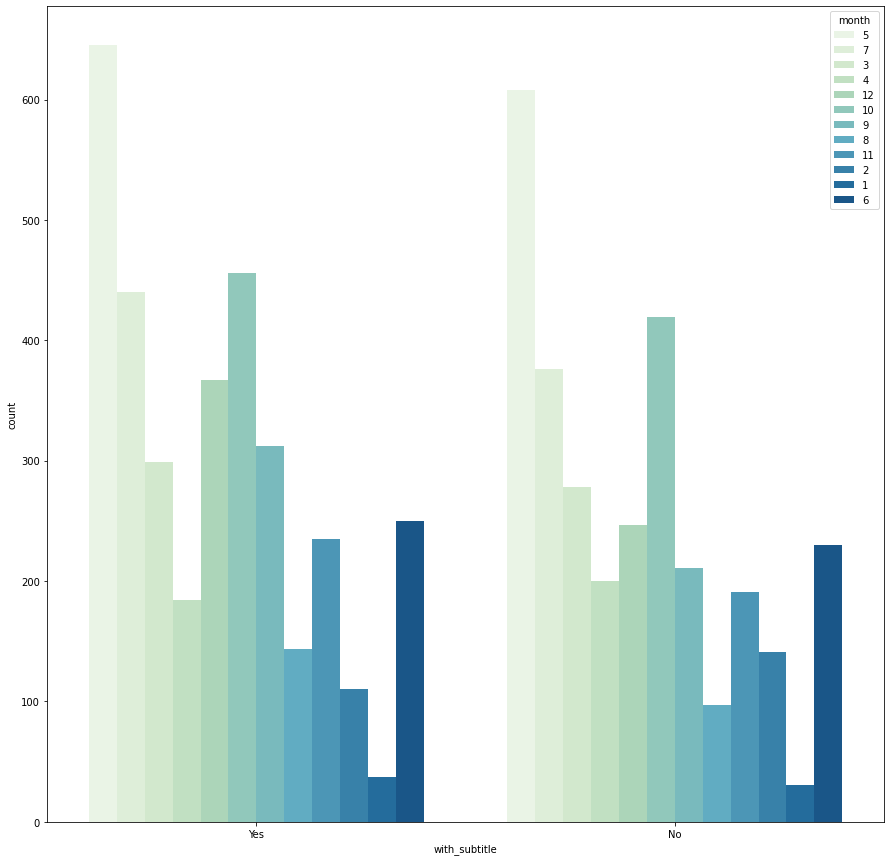

In [ ]:
# Graficos de Barra Agrupados

for i in range(0, len(cat_list)):
    primary_cat = cat_list[i]
    for j in range(0, len(cat_list)):
        secondary_cat = cat_list[j]
        if secondary_cat != primary_cat:
            plt.figure (figsize = (15,15))
            chart = sns.countplot(
                data = df,
                x= primary_cat, 
                hue= secondary_cat,
                palette = 'GnBu',
                order=df[primary_cat].value_counts().iloc[:10].index) #show only TOP10

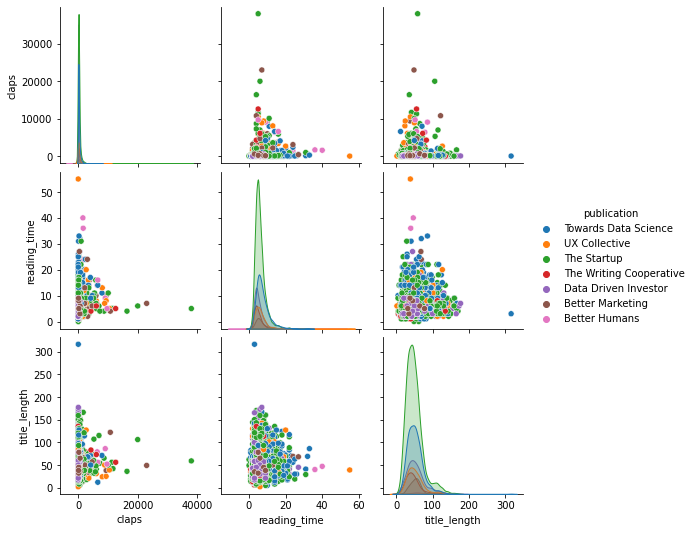

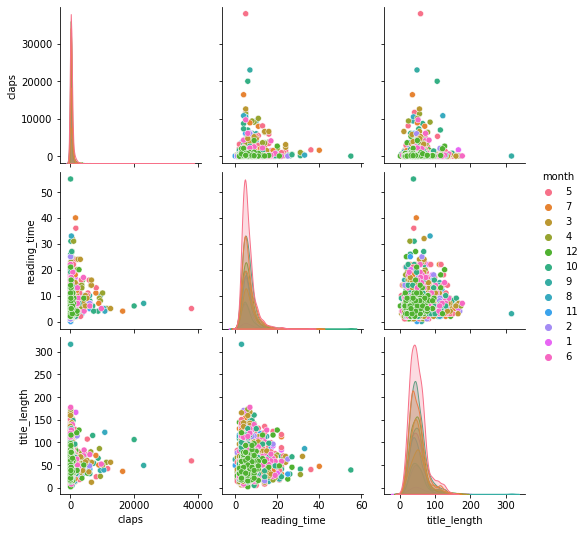

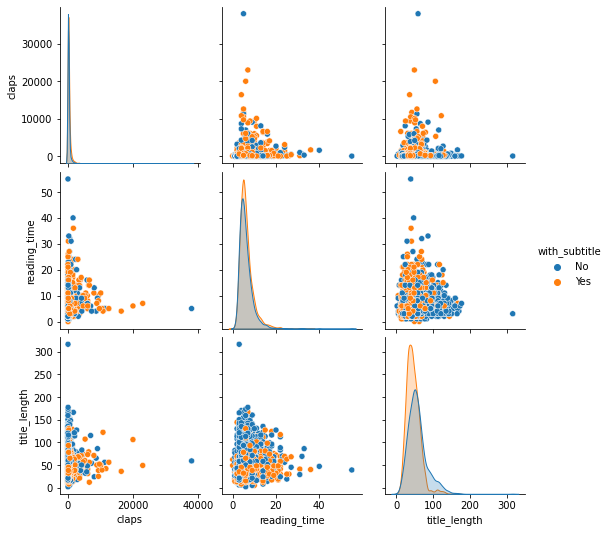

In [ ]:
# Pairplots con distintas tonalidades
for i in range(0, len(cat_list)):
    hue_cat = cat_list[i]
    sns.pairplot(df, hue = hue_cat)

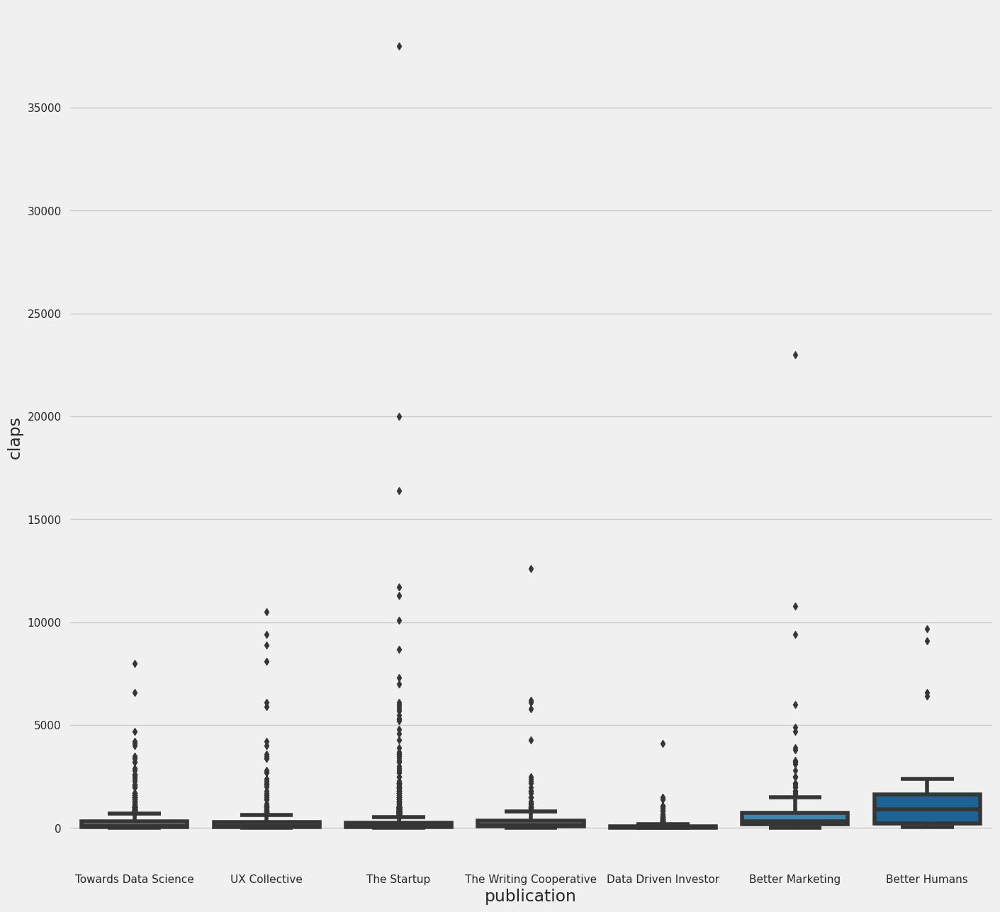

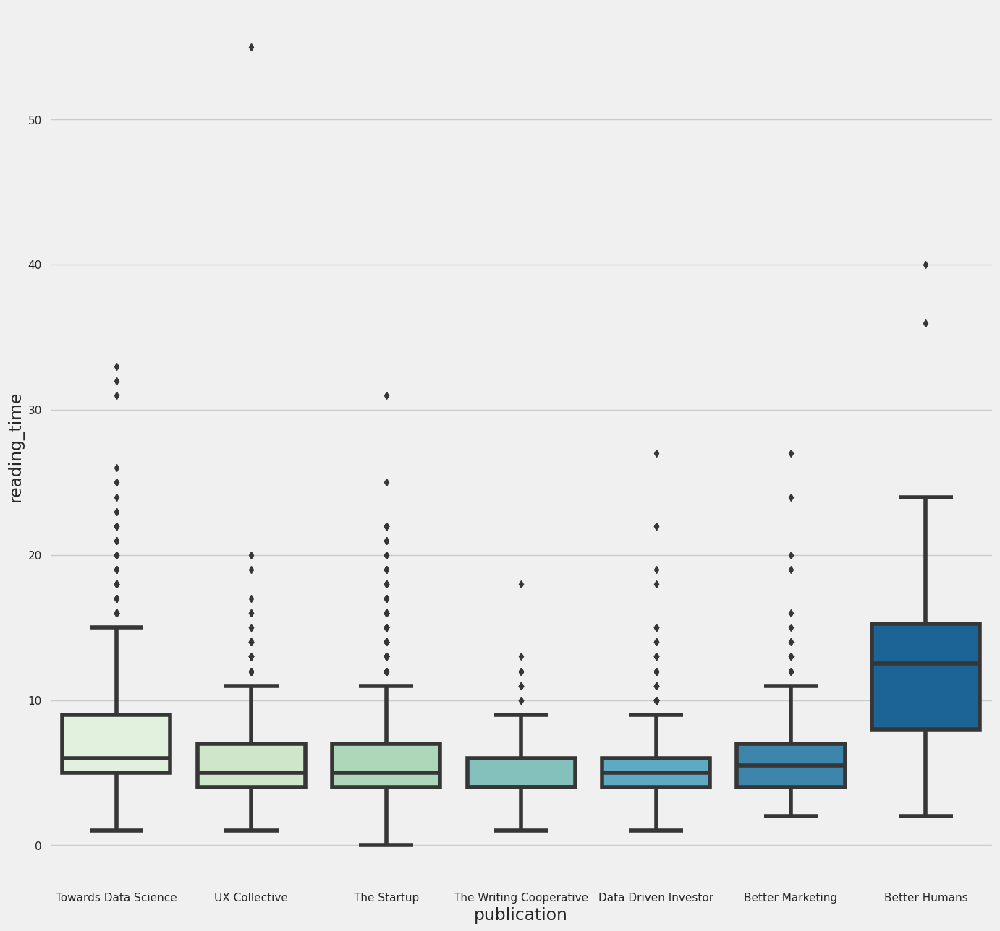

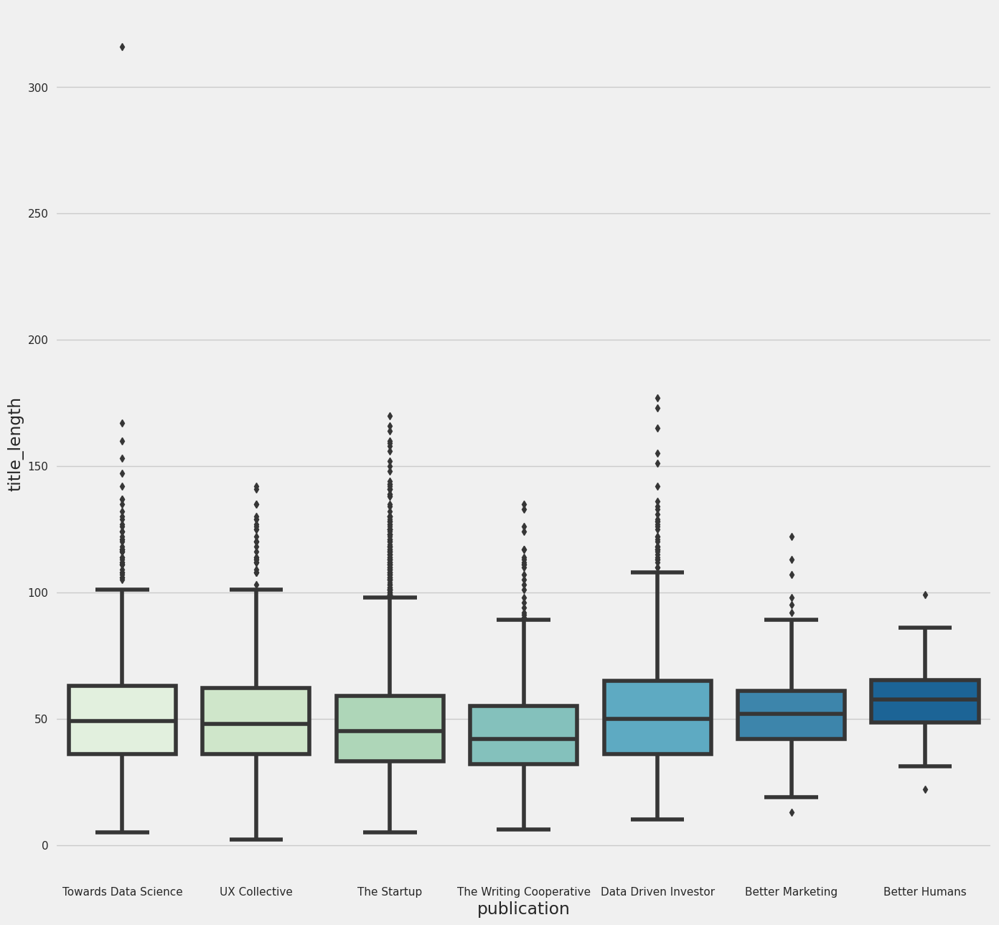

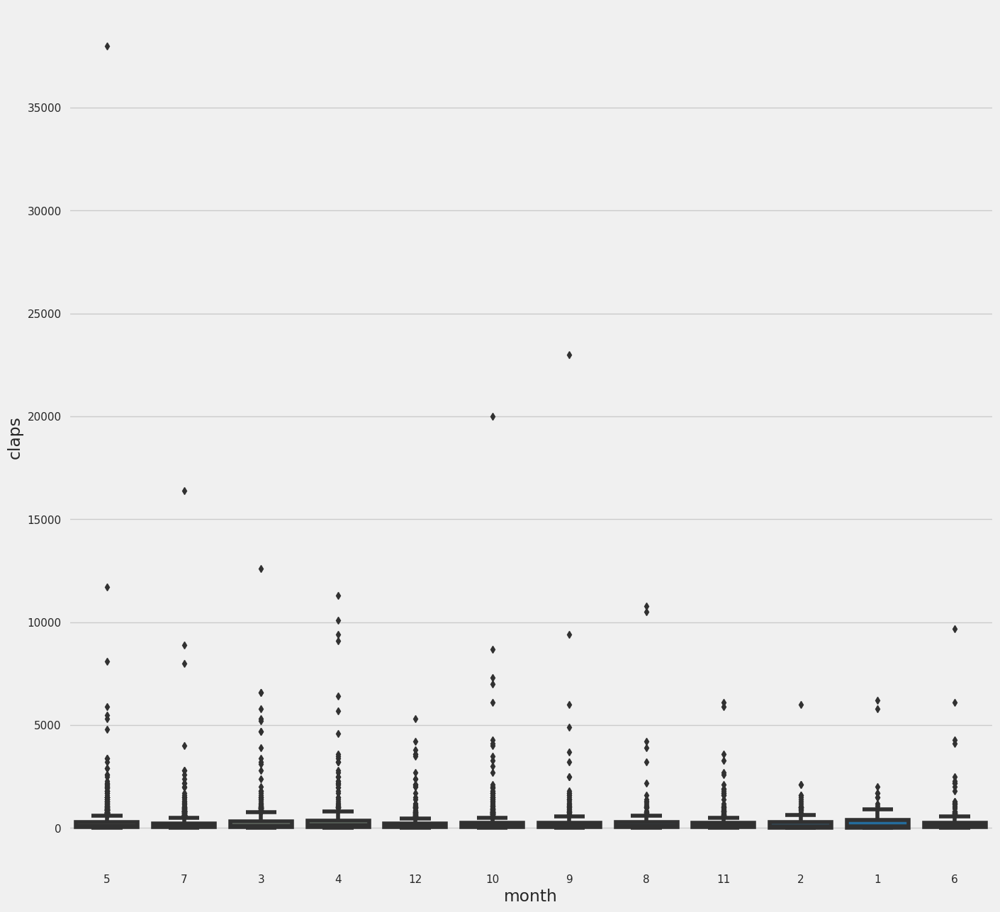

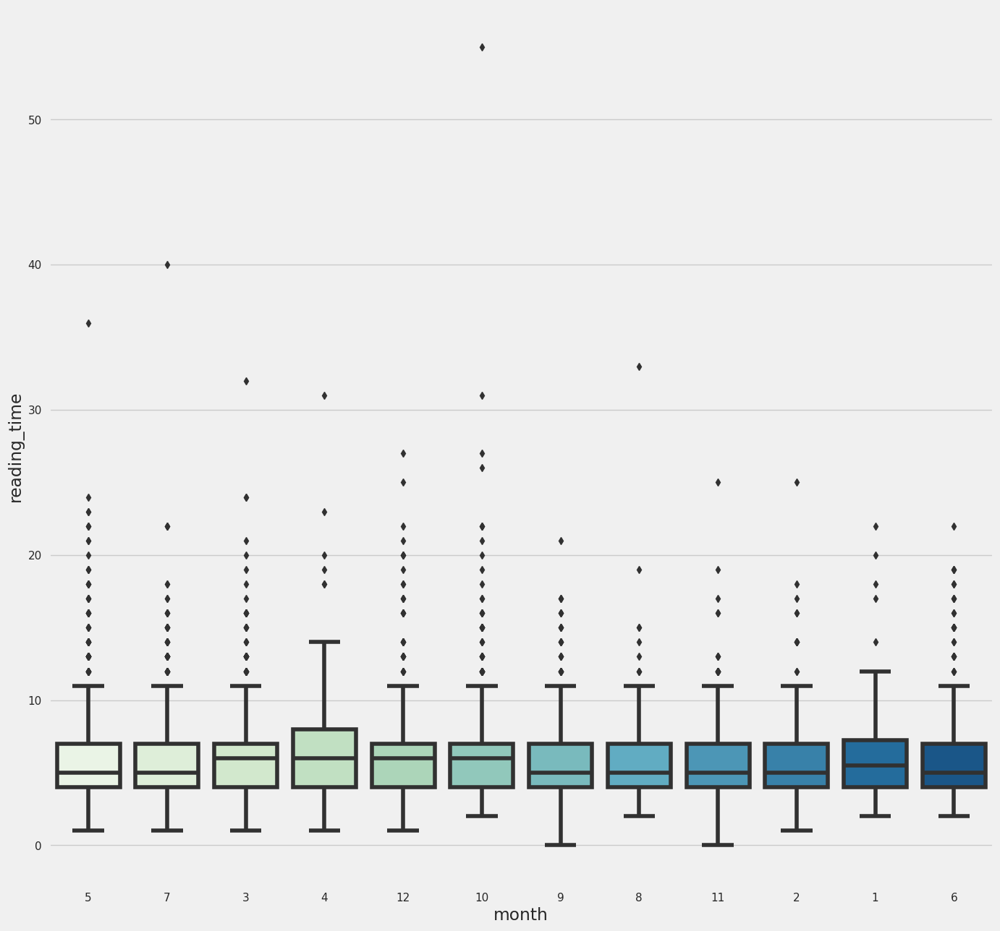

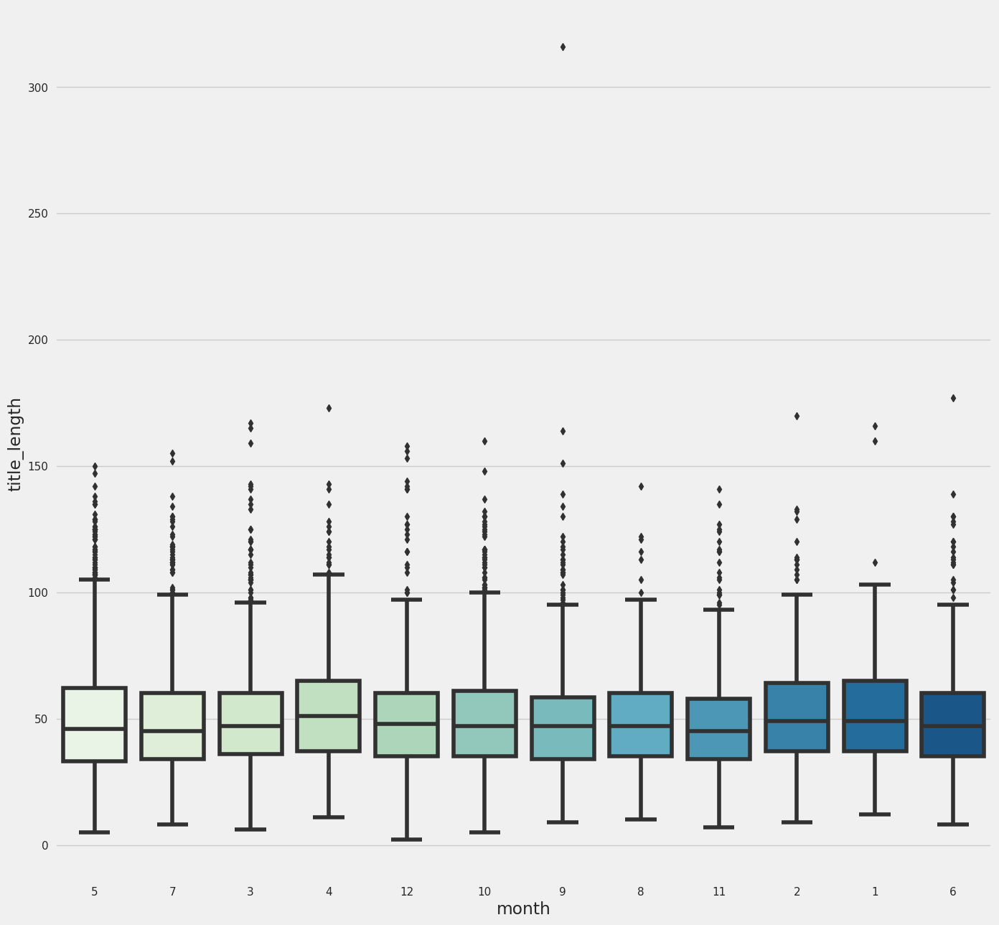

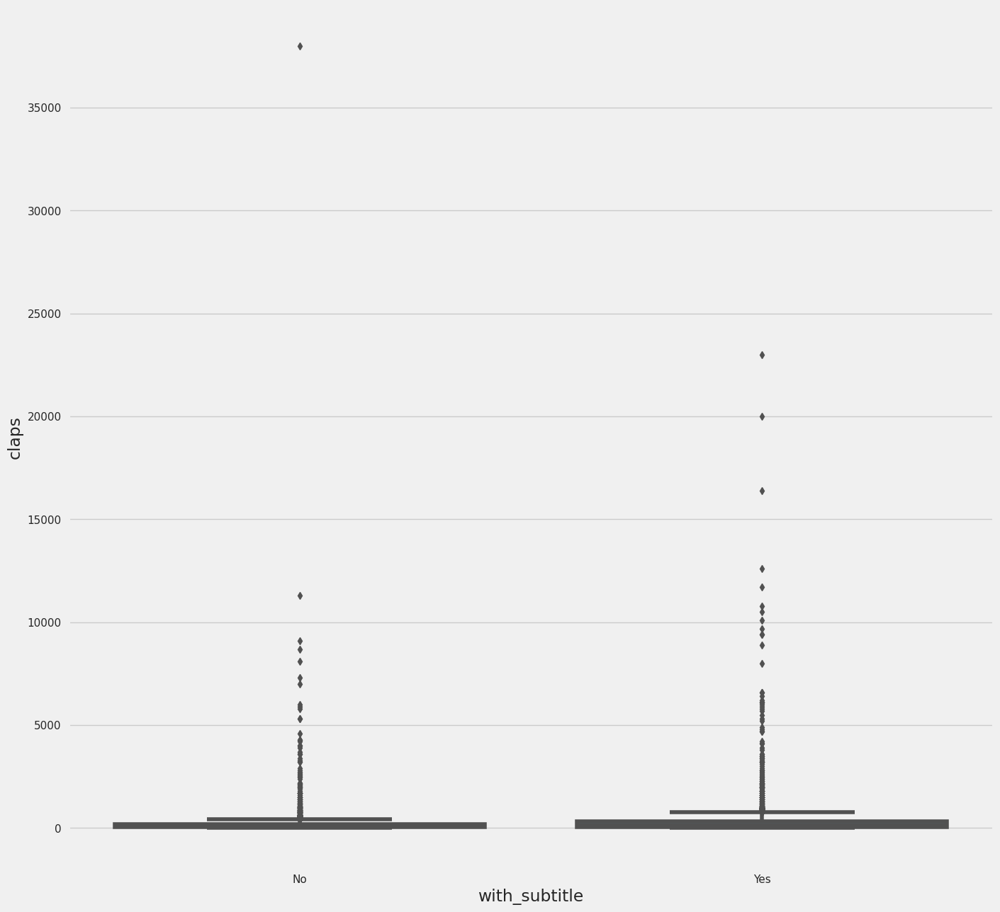

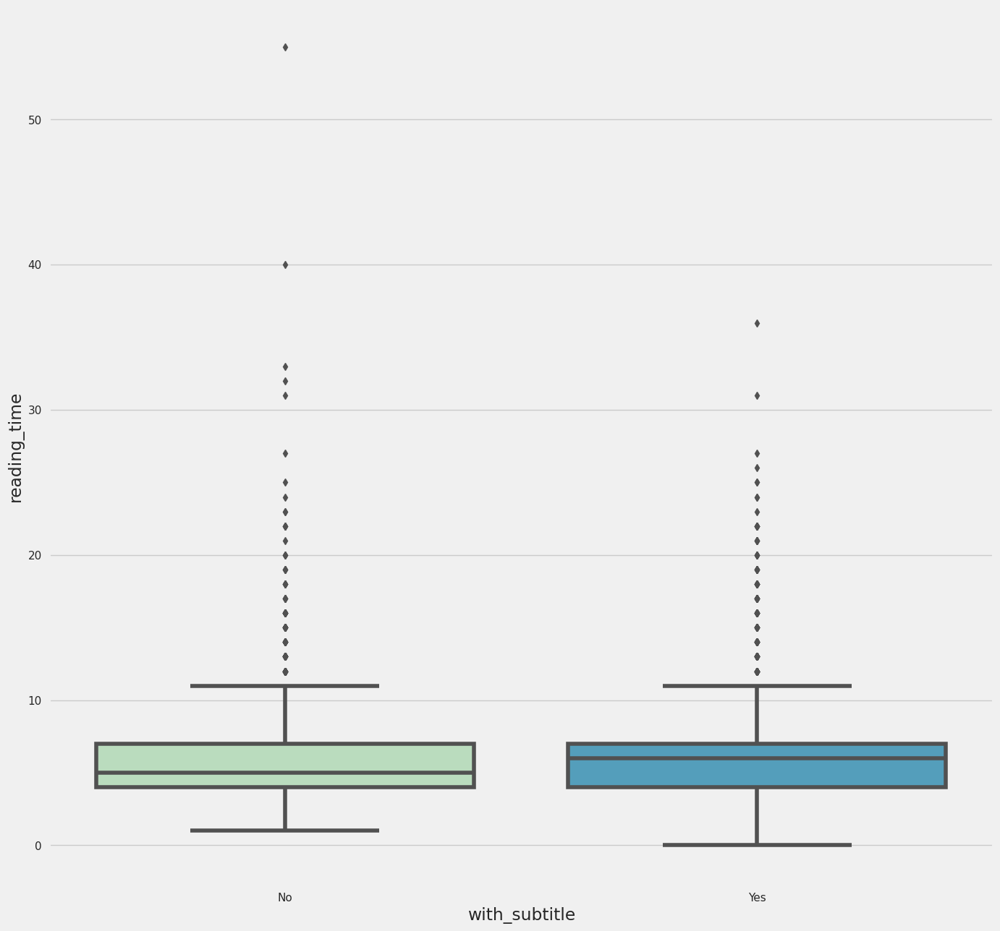

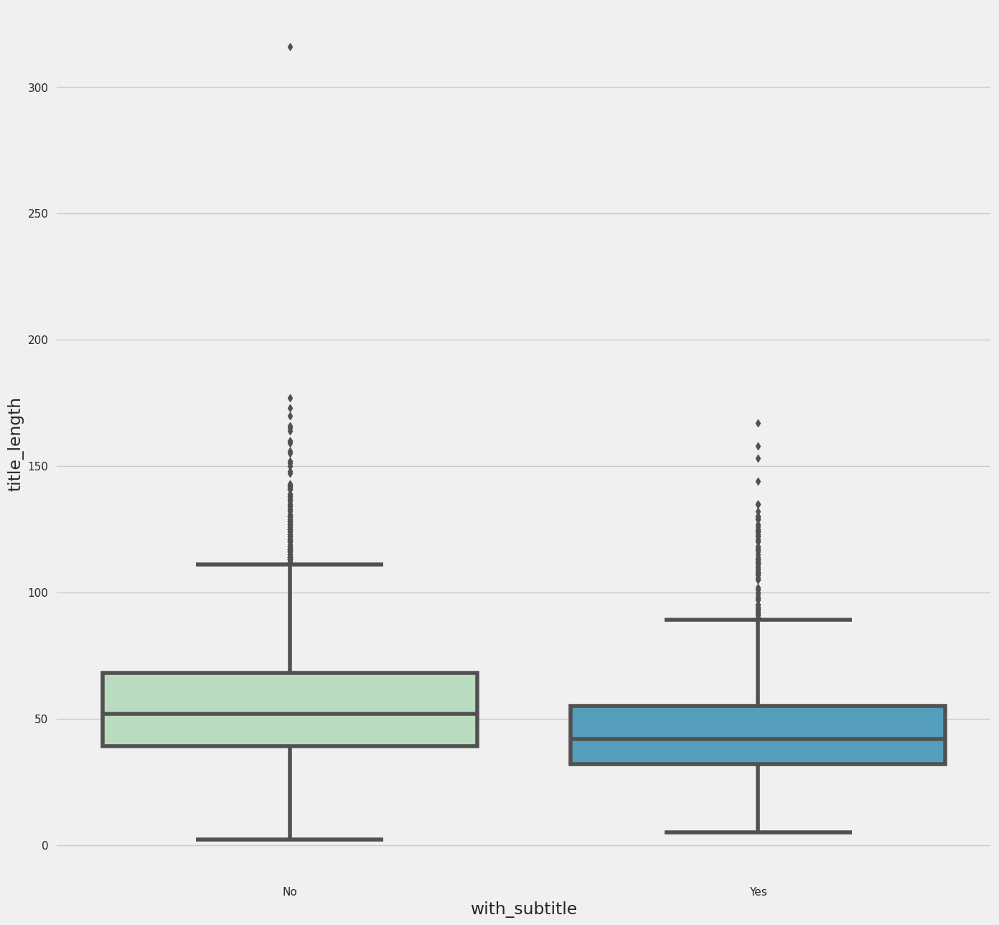

In [ ]:
# Box Plot - Diagrama de Caja y Bigotes

for i in range(0, len(cat_list)):
    cat = cat_list[i]
    for j in range(0, len(num_list)):
        num = num_list[j]
        plt.figure (figsize = (15,15))
        sns.boxplot( x = cat, y = num, data = df, palette = "GnBu")

# Automatic EDA

In [24]:
pip install sweetviz


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 15.1 MB 3.7 MB/s 


In [25]:
import sweetviz as sv

Descargo el CSV de la siguiente URL: [Advertising.csv](https://www.kaggle.com/datasets/bumba5341/advertisingcsv)



In [ ]:
 files.upload() 

Saving Advertising.csv to Advertising.csv


{'Advertising.csv': b'"","TV","Radio","Newspaper","Sales"\r\n"1",230.1,37.8,69.2,22.1\r\n"2",44.5,39.3,45.1,10.4\r\n"3",17.2,45.9,69.3,9.3\r\n"4",151.5,41.3,58.5,18.5\r\n"5",180.8,10.8,58.4,12.9\r\n"6",8.7,48.9,75,7.2\r\n"7",57.5,32.8,23.5,11.8\r\n"8",120.2,19.6,11.6,13.2\r\n"9",8.6,2.1,1,4.8\r\n"10",199.8,2.6,21.2,10.6\r\n"11",66.1,5.8,24.2,8.6\r\n"12",214.7,24,4,17.4\r\n"13",23.8,35.1,65.9,9.2\r\n"14",97.5,7.6,7.2,9.7\r\n"15",204.1,32.9,46,19\r\n"16",195.4,47.7,52.9,22.4\r\n"17",67.8,36.6,114,12.5\r\n"18",281.4,39.6,55.8,24.4\r\n"19",69.2,20.5,18.3,11.3\r\n"20",147.3,23.9,19.1,14.6\r\n"21",218.4,27.7,53.4,18\r\n"22",237.4,5.1,23.5,12.5\r\n"23",13.2,15.9,49.6,5.6\r\n"24",228.3,16.9,26.2,15.5\r\n"25",62.3,12.6,18.3,9.7\r\n"26",262.9,3.5,19.5,12\r\n"27",142.9,29.3,12.6,15\r\n"28",240.1,16.7,22.9,15.9\r\n"29",248.8,27.1,22.9,18.9\r\n"30",70.6,16,40.8,10.5\r\n"31",292.9,28.3,43.2,21.4\r\n"32",112.9,17.4,38.6,11.9\r\n"33",97.2,1.5,30,9.6\r\n"34",265.6,20,0.3,17.4\r\n"35",95.7,1.4,7.4,9.5\r

In [ ]:
df1 = pd.read_csv('Advertising.csv')
df1

,Unnamed: 0,TV,Radio,Newspaper,Sales
0,1,230.1,37.8,69.2,22.1
1,2,44.5,39.3,45.1,10.4
2,3,17.2,45.9,69.3,9.3
3,4,151.5,41.3,58.5,18.5
4,5,180.8,10.8,58.4,12.9
...,...,...,...,...,...
195,196,38.2,3.7,13.8,7.6
196,197,94.2,4.9,8.1,9.7
197,198,177.0,9.3,6.4,12.8
198,199,283.6,42.0,66.2,25.5


In [ ]:
df1=df1.drop(['Unnamed: 0'], axis=1)
df1

,TV,Radio,Newspaper,Sales
0,230.1,37.8,69.2,22.1
1,44.5,39.3,45.1,10.4
2,17.2,45.9,69.3,9.3
3,151.5,41.3,58.5,18.5
4,180.8,10.8,58.4,12.9
...,...,...,...,...
195,38.2,3.7,13.8,7.6
196,94.2,4.9,8.1,9.7
197,177.0,9.3,6.4,12.8
198,283.6,42.0,66.2,25.5


In [ ]:
# Se analiza el dataset
advert_report = sv.analyze(df1)


                                             |          | [  0%]   00:00 -> (? left)

In [ ]:
# Se muestra el reporte
advert_report.show_html('Advertising.html')

Report Advertising.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.



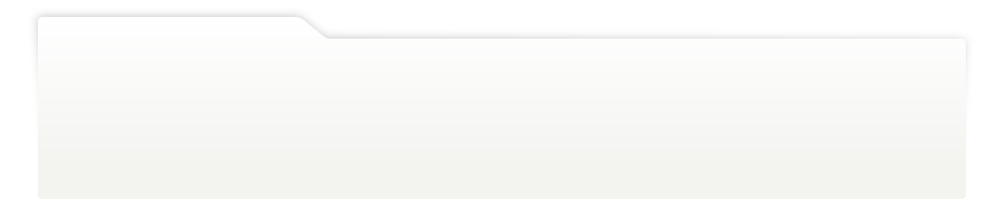
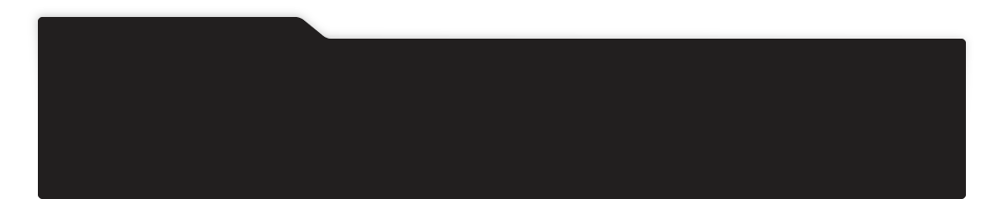
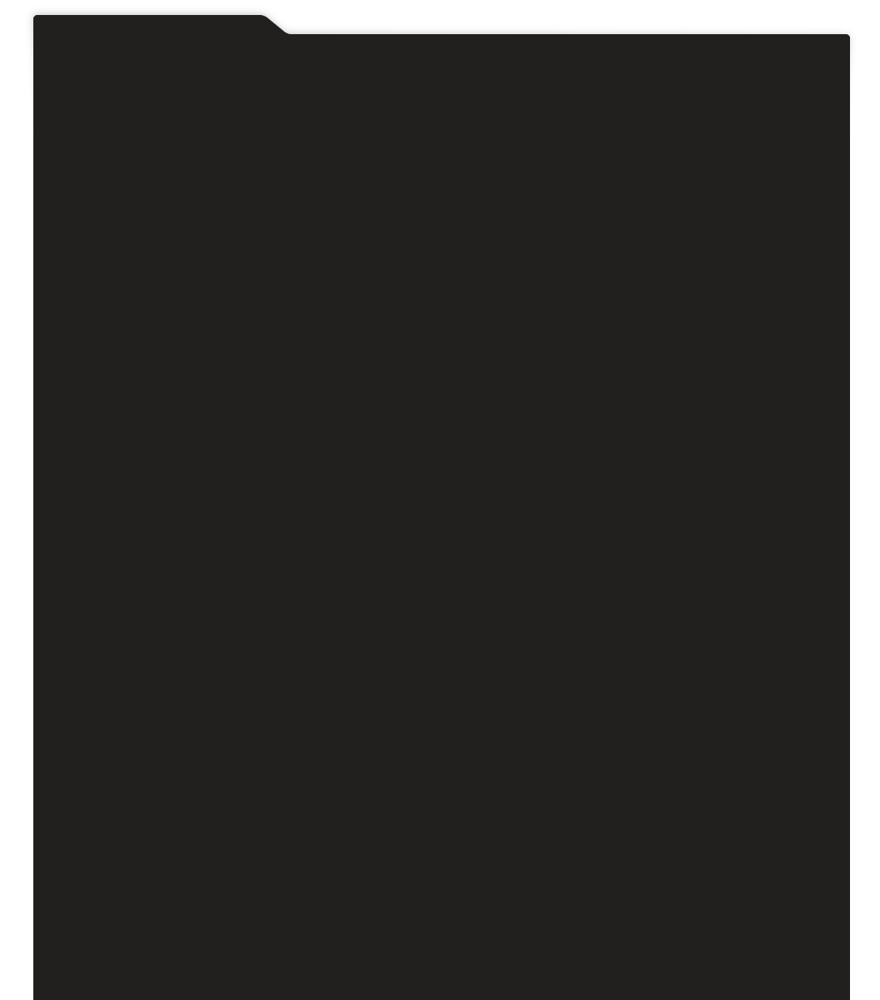
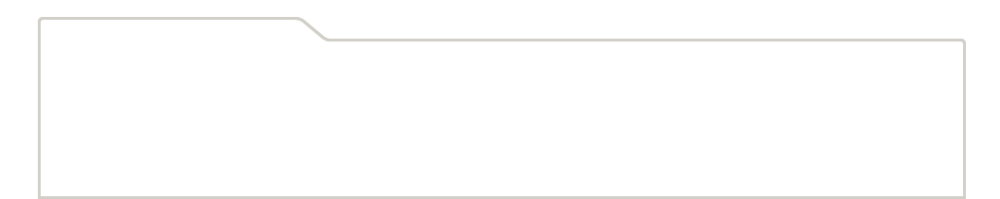
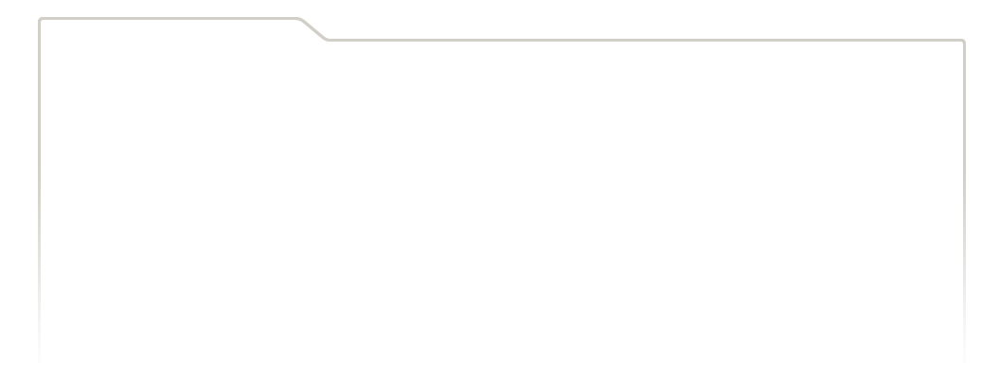
...
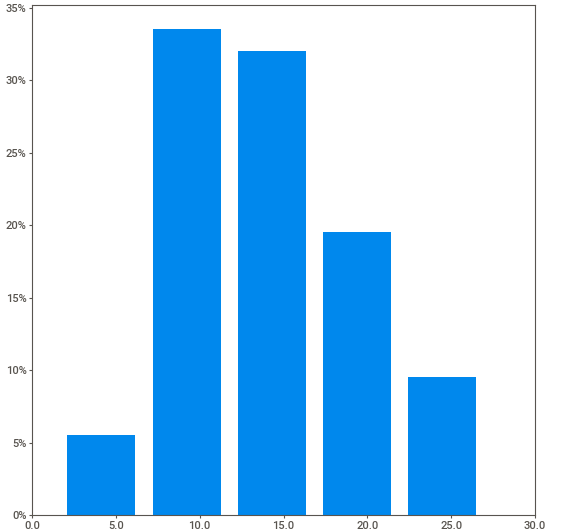
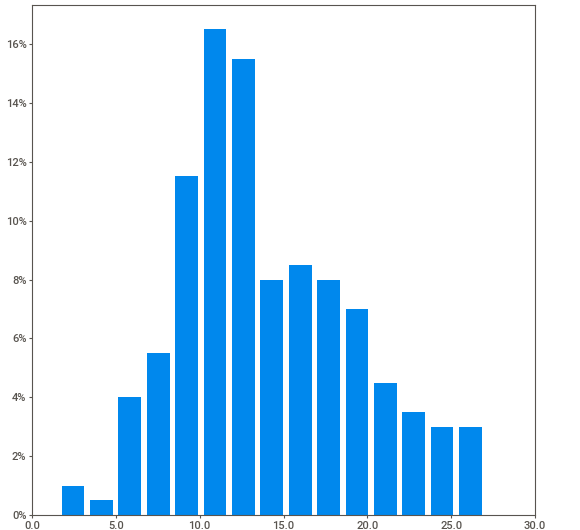
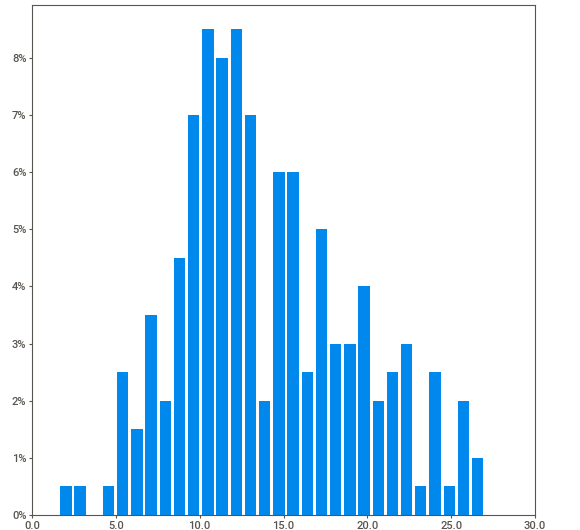
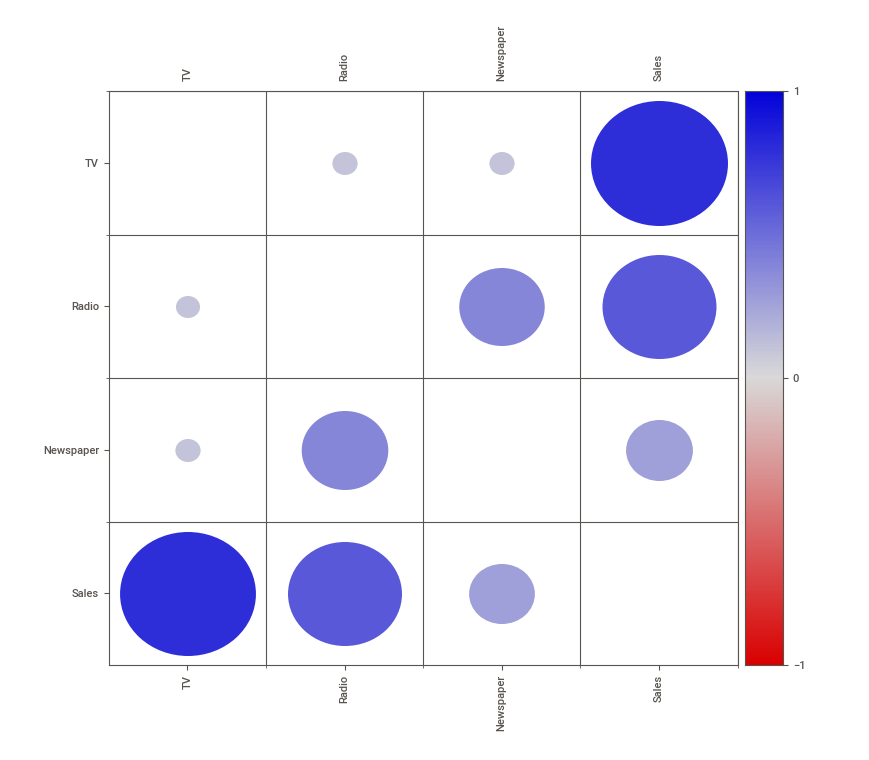
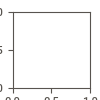

In [ ]:
advert_report.show_notebook()

                                             |          | [  0%]   00:00 -> (? left)


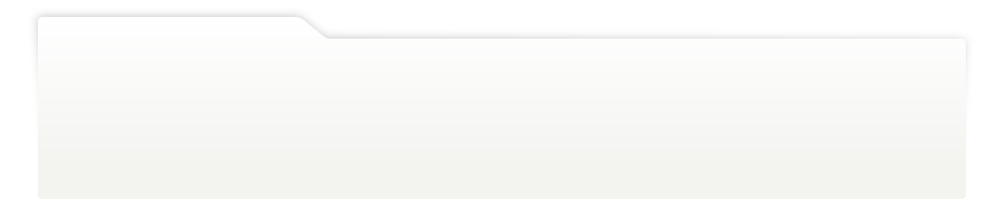
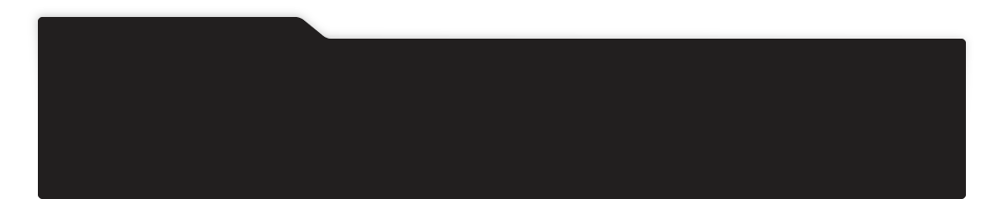
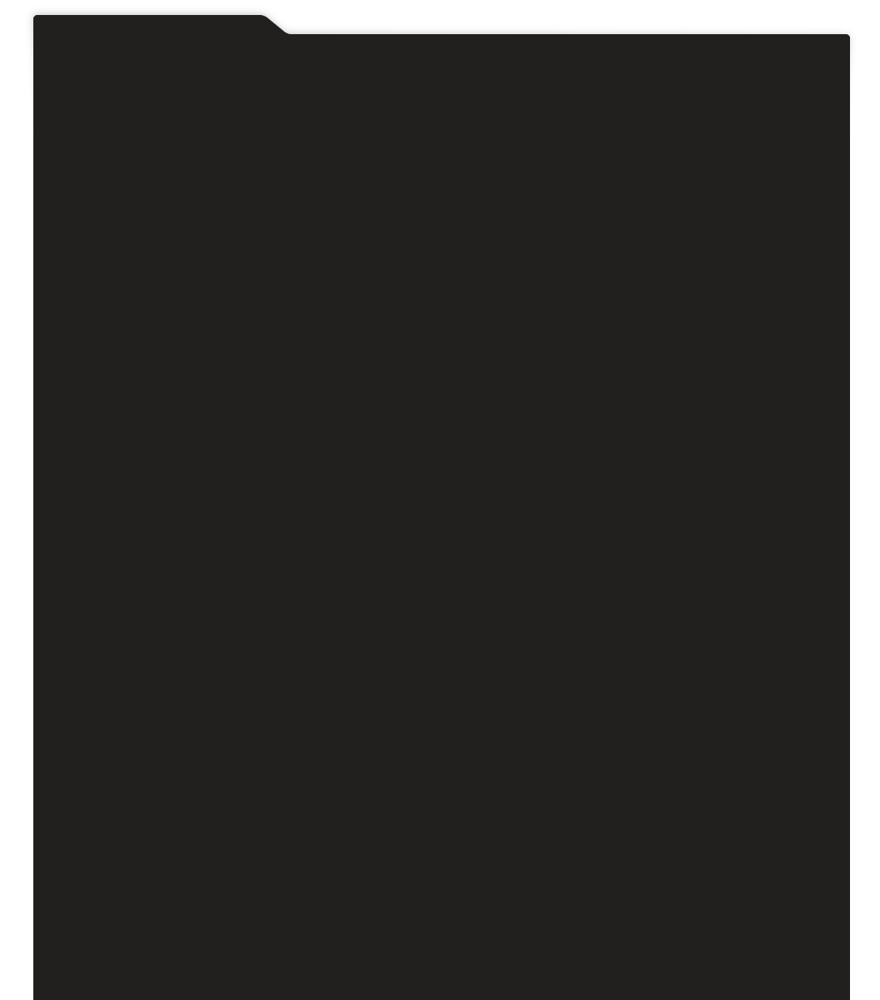
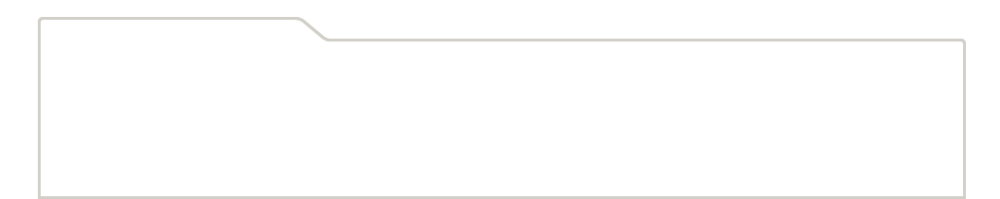
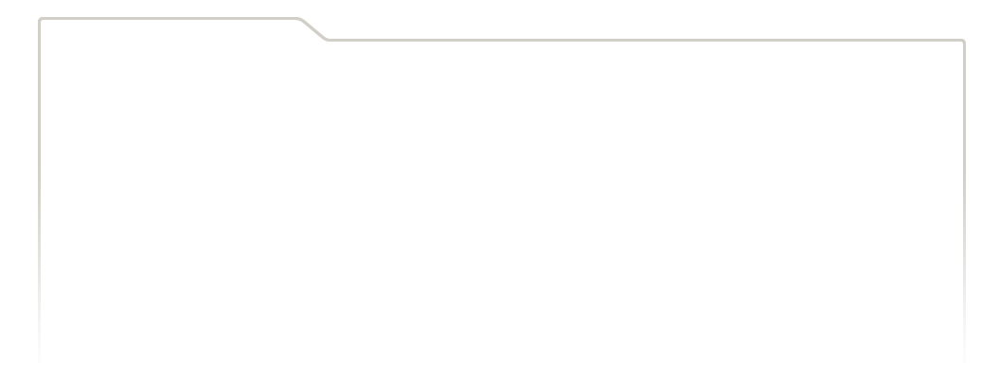
...
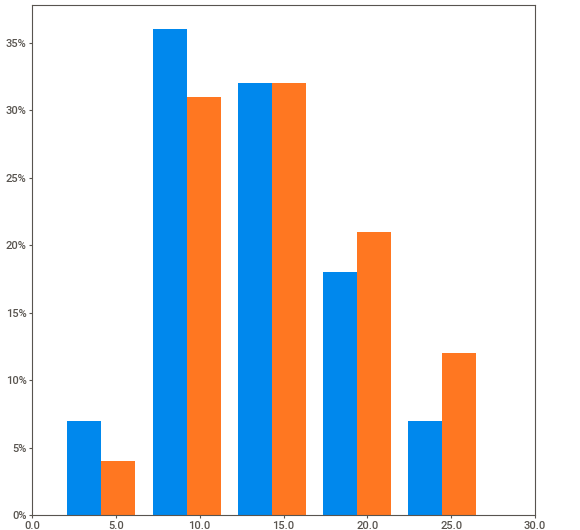
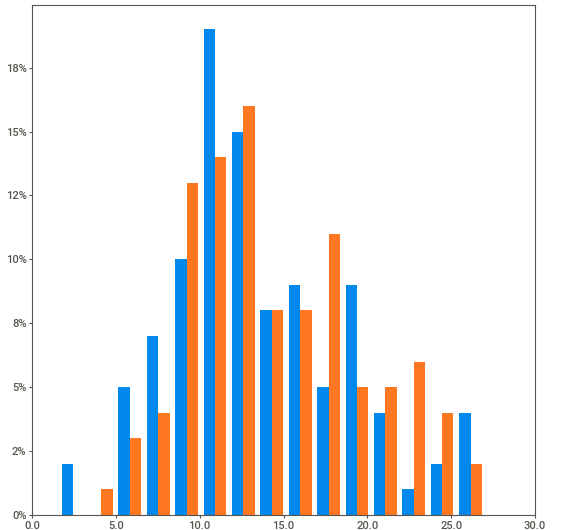
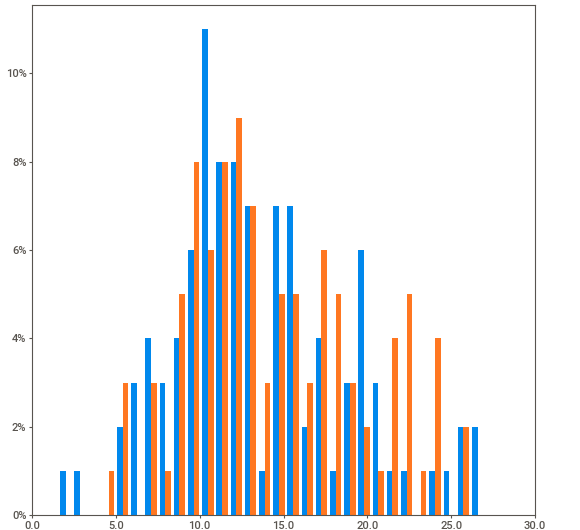
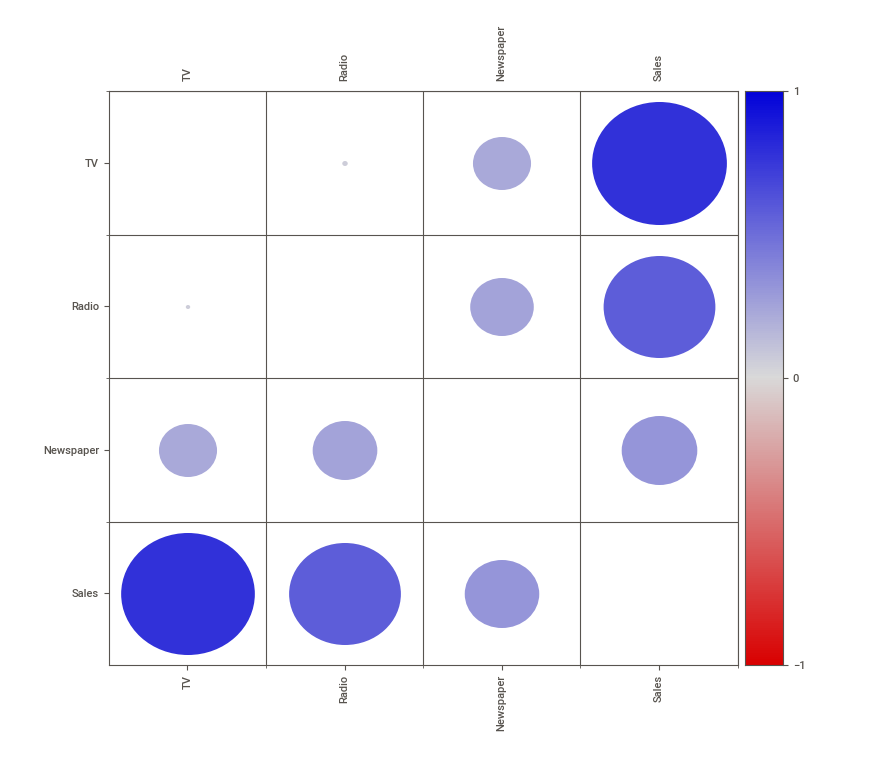
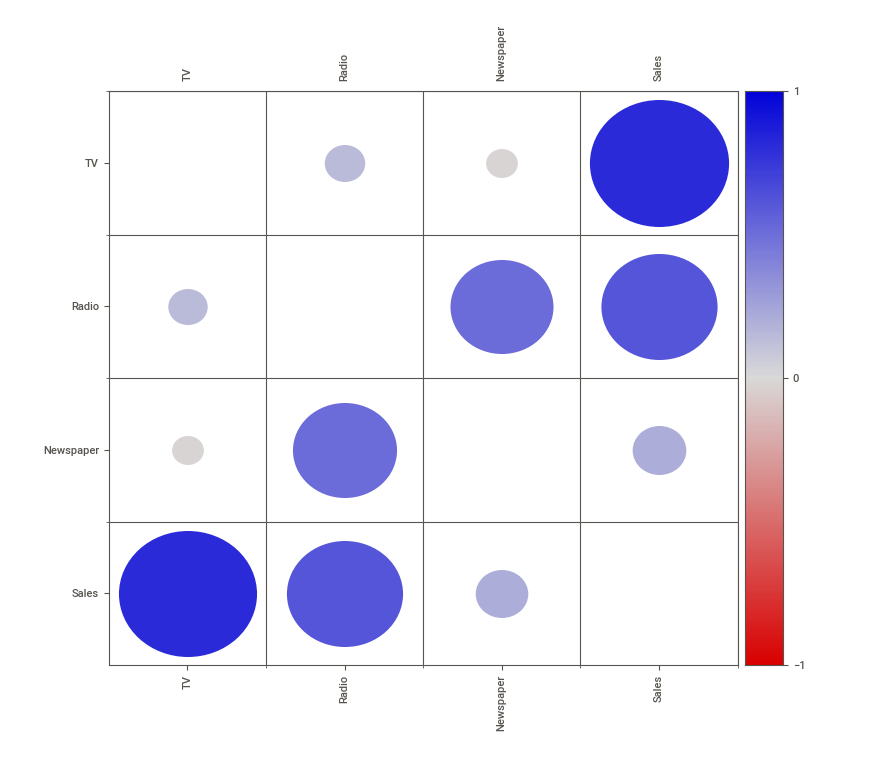

In [ ]:
df2 = sv.compare(df1[100:], df1[:100]) # compara las primeras 100 filas con las ultimas 100
df2.show_notebook()

Autoviz

In [ ]:
pip install autoviz

Alert! from version 0.1.42, after importing, you must do '%matplotlib inline' to display charts in Jupyter Notebooks.
    AV = AutoViz_Class()
    dfte = AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=0, lowess=False,
               chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30, save_plot_dir=None)
Note: verbose=0 or 1 generates charts and displays them in your local Jupyter notebook.
      verbose=2 does not display plots but saves them in AutoViz_Plots folder in local machine.
Updated: chart_format='bokeh' generates and displays charts in your local Jupyter notebook.
      chart_format='server' generates and displays charts in the browser - one tab for each chart.
      chart_format='html' silently saves charts HTML format - they are also interactive!


<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
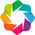

In [ ]:
from autoviz.AutoViz_Class import AutoViz_Class

Shape of your Data Set loaded: (6508, 10)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
    10 Predictors classified...
        1 variables removed since they were ID or low-information variables
Number of All Scatter Plots = 3
Could not draw wordcloud plot for url
Could not draw wordcloud plot for title
Could not draw wordcloud plot for subtitle
Time to run AutoViz = 3 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


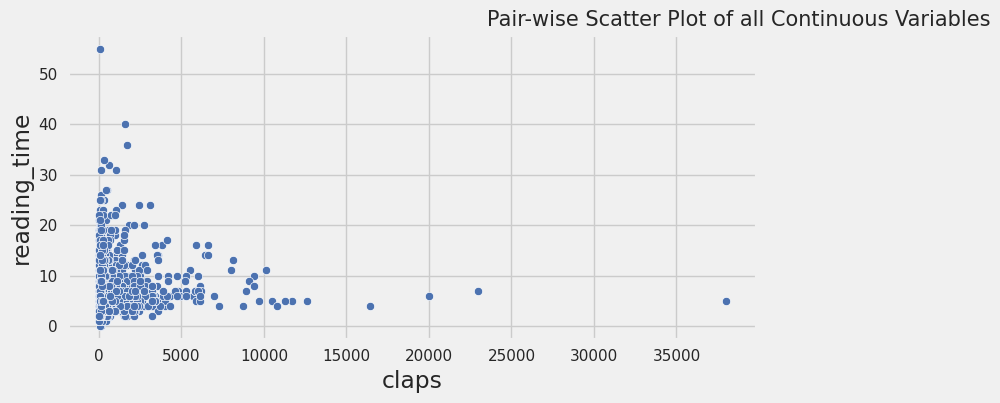

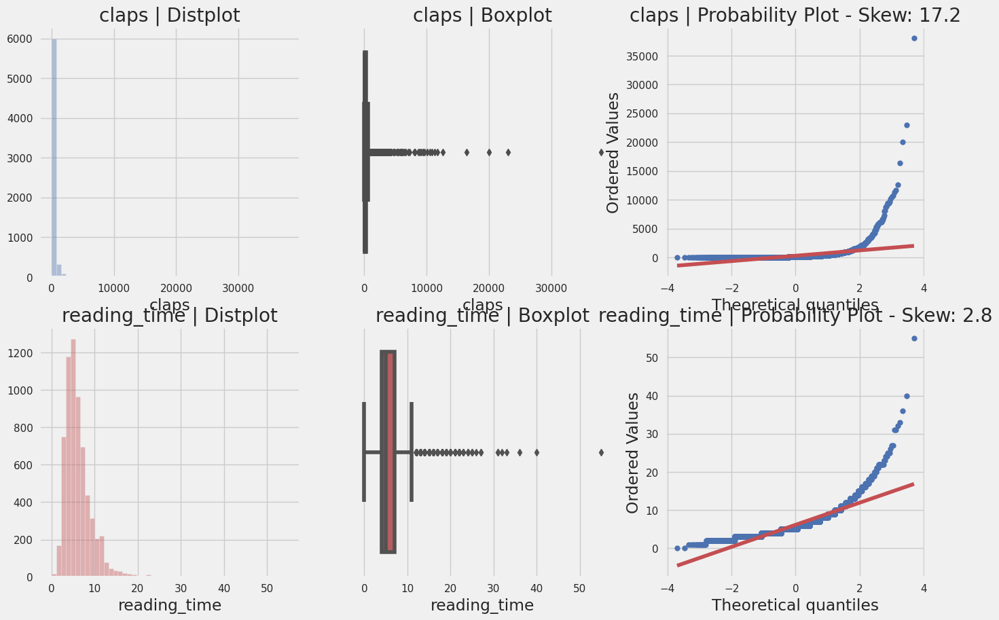

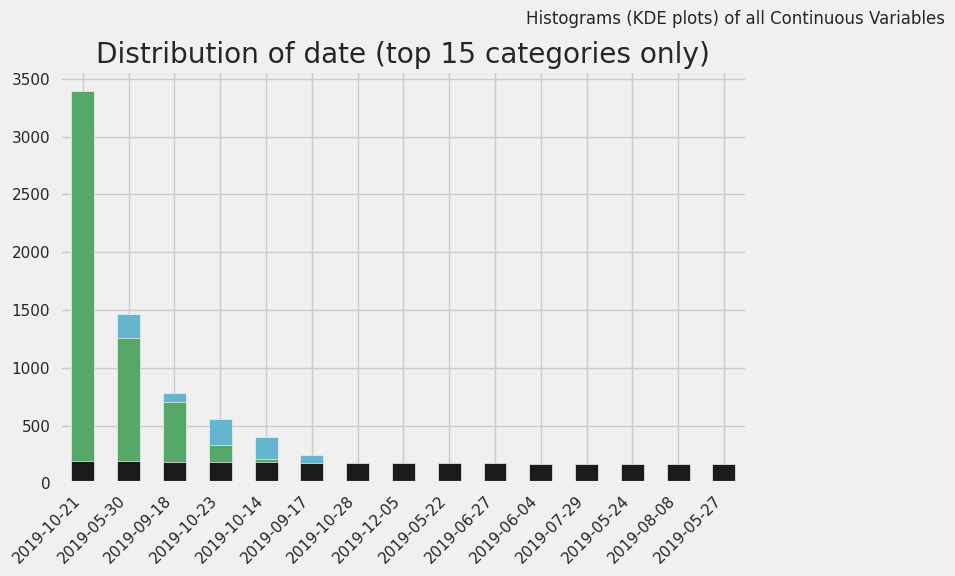

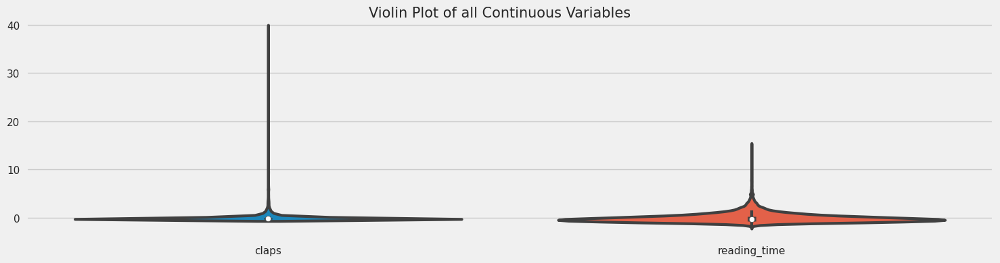

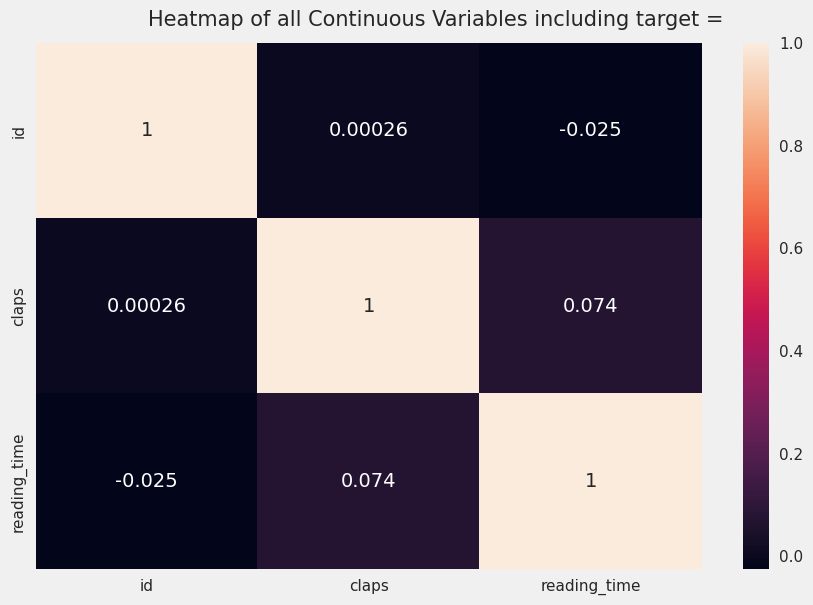

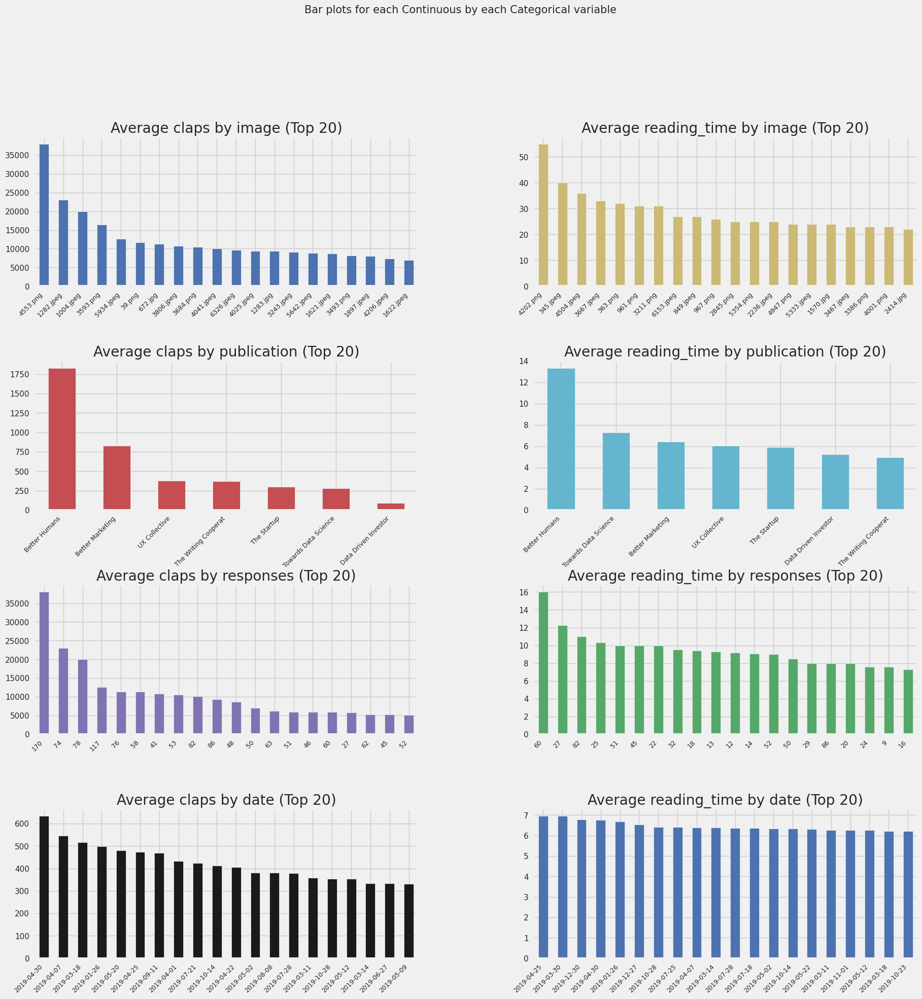

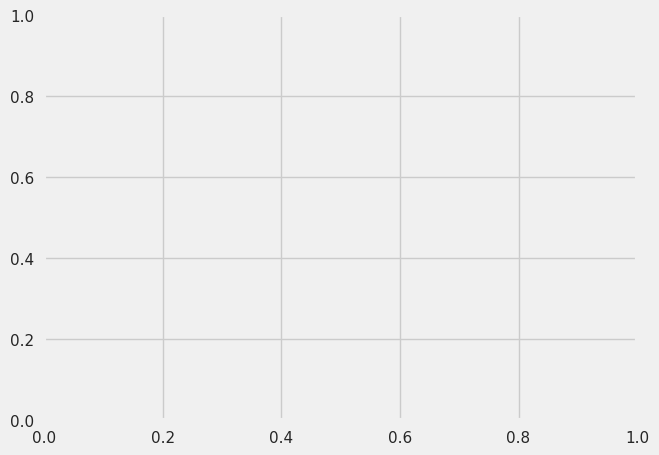

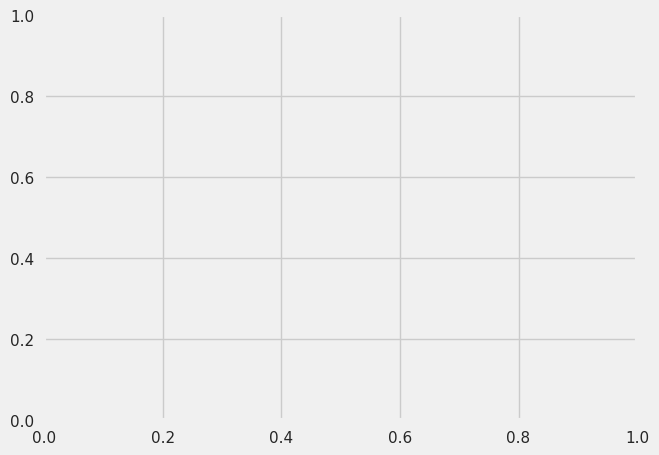

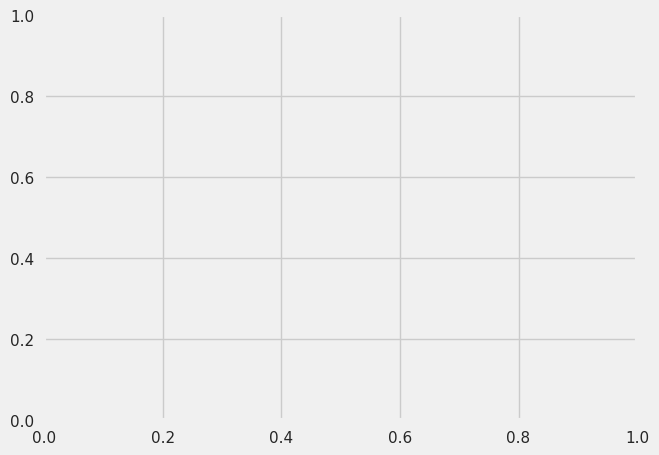

In [ ]:
AV = AutoViz_Class()
df = AV.AutoViz('medium_data.csv')

D-Tale

In [ ]:
pip install dtale

In [ ]:
import dtale
import dtale.app as dtale_app

dtale_app.USE_COLAB = True

In [ ]:
dtale. show(df)

https://2y9wfxh7ywn-496ff2e9c6d22116-40000-colab.googleusercontent.com/dtale/main/14